# setup

In [163]:
import os
local_path = 'C:/Users/Milva/glambie/glambie_demo_notebooks-main'
os.chdir(local_path)

#load libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import matplotlib.colors as colors
import matplotlib.cm as cmx


import urllib.request as url
import glob
import csv
from scipy.stats import spearmanr

from glambie_demo_notebooks.helpers import glambie_regions_dropdown, glambie_years_dropdown, derivative_to_cumulative, load_all_region_dataframes
from glambie_demo_notebooks.plotting import global_cumulative_plot, global_comparison_stacked_region_plot, histogram_of_region_contributions_to_global_loss_two_years, histogram_of_region_contributions_to_global_loss, histogram_of_region_contributions_to_global_loss_two_years, global_stacked_all_regions_plot
from glambie_demo_notebooks.plotting import single_region_derivative_plot, single_region_cumulative_plot, two_region_comparison_plot, transform_string
from glambie.const import regions

sns.set_theme(palette='colorblind', style='white', font_scale=1.2)
sns.set_style({'axes.linewidth': 2, 'axes.edgecolor':'lightgrey'})

colors_list = sns.color_palette(palette='colorblind', n_colors=18, desat=0.9)

In [116]:
#data_directory = os.path.join(local_path, 'glambie_results_20240716/calendar_years/')
#define data directories
d_dir_rgi6 = 'C:/Users/Milva/glambie/glambie/output_plots/clean_output/reanalysis_2025-11-18_16-33/calendar_years/'
d_dir_rgi7 = 'C:/Users/Milva/glambie/glambie/output_plots/clean_output/RGI7_2025-11-24_17-01/calendar_years/'

#get a list of all the regions/folders excluding global
list_of_folders = sorted(os.listdir(d_dir_rgi6)[1:20])
list_of_folders

list_of_folders = sorted(os.listdir(d_dir_rgi6))
list_of_folders

['0_global.csv',
 '10_north_asia.csv',
 '11_central_europe.csv',
 '12_caucasus_middle_east.csv',
 '13_central_asia.csv',
 '14_south_asia_west.csv',
 '15_south_asia_east.csv',
 '16_low_latitudes.csv',
 '17_southern_andes.csv',
 '18_new_zealand.csv',
 '19_antarctic_and_subantarctic.csv',
 '1_alaska.csv',
 '2_western_canada_us.csv',
 '3_arctic_canada_north.csv',
 '4_arctic_canada_south.csv',
 '5_greenland_periphery.csv',
 '6_iceland.csv',
 '7_svalbard.csv',
 '8_scandinavia.csv',
 '9_russian_arctic.csv']

# functions

In [117]:
def two_region_comparison_plot2(region_name, data_distinction, comparison_data_distinction, cumulative_data_all_gt, cumulative_errors_all_gt, cumulative_data_all_gt_comparison,
                               cumulative_errors_all_gt_comparison, cumulative_data_all_mwe, cumulative_errors_all_mwe,
                               cumulative_data_all_mwe_comparison, cumulative_errors_all_mwe_comparison):
    
    _, axs = plt.subplots(1, 2, figsize=(20,8))
    axs[0].set_xlim(2000,2024)

    axs[0].plot(cumulative_data_all_gt.dates, cumulative_data_all_gt.changes, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction)
    axs[0].fill_between(cumulative_data_all_gt.dates, cumulative_data_all_gt.changes - cumulative_errors_all_gt.errors,
                        cumulative_data_all_gt.changes + cumulative_errors_all_gt.errors, alpha=0.2)

    axs[0].plot(cumulative_data_all_gt_comparison.dates, cumulative_data_all_gt_comparison.changes, linewidth=3, zorder=2, label=region_name + ' - ' + comparison_data_distinction)
    axs[0].fill_between(cumulative_data_all_gt_comparison.dates, cumulative_data_all_gt_comparison.changes - cumulative_errors_all_gt_comparison.errors,
                        cumulative_data_all_gt_comparison.changes + cumulative_errors_all_gt_comparison.errors, alpha=0.2)

    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Cumulative Change [Gt]')
    axs[0].grid(True, alpha=0.8)

    
    axs[1].set_xlim(2000,2024)

    axs[1].plot(cumulative_data_all_mwe.dates, cumulative_data_all_mwe.changes, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction)
    axs[1].fill_between(cumulative_data_all_mwe.dates, cumulative_data_all_mwe.changes - cumulative_errors_all_mwe.errors,
                        cumulative_data_all_mwe.changes + cumulative_errors_all_mwe.errors, alpha=0.2)

    axs[1].plot(cumulative_data_all_mwe_comparison.dates, cumulative_data_all_mwe_comparison.changes, linewidth=3, zorder=2, label=region_name + ' - ' + comparison_data_distinction)
    axs[1].fill_between(cumulative_data_all_mwe_comparison.dates, cumulative_data_all_mwe_comparison.changes - cumulative_errors_all_mwe_comparison.errors,
                        cumulative_data_all_mwe_comparison.changes + cumulative_errors_all_mwe_comparison.errors, alpha=0.2)

    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Cumulative Change [metres water equivalent]')

    axs[0].legend(loc = 'lower left', fontsize=16)
    plt.suptitle(region_name + ': comparison RGI 6 and RGI 7: total ice loss, 2000 - 2023', fontsize=18)
    axs[1].grid(True, alpha=0.8)


    return

In [118]:
def region_cumulative_plot(region_name, cumulative_data, cumulative_errors, region_dataframe, unit):
    
    _, axs = plt.subplots(1, 1, figsize=(12,8))
    axs.set_ylim(-0.01, 0.0025)
    axs.set_xlim(2000,2024)
    axs_2 = axs.twinx()  
    
    axs.hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    
    axs.bar(region_dataframe.start_dates+0.5, region_dataframe.mwe_difference, yerr=region_dataframe.mwe_errors_difference, capsize=3, color='coral', ecolor='coral', alpha=0.3, zorder=1) 
    axs.set_ylabel('Difference in Annual Change [m w.e. yr$^{-1}$]')

    axs_2.plot(cumulative_data.dates, cumulative_data.changes, linewidth=3, zorder=2)
    axs_2.fill_between(cumulative_data.dates, cumulative_data.changes - cumulative_errors.errors, cumulative_data.changes + cumulative_errors.errors, alpha=0.2, zorder=2)

    axs_2.set_xlabel('Year')
    axs_2.set_ylabel('Difference in Cumulative Change [{}]'.format(unit))
    axs_2.set_title(region_name + ': difference in ice loss RGI 6 & 7 from 2000 - 2023', fontsize=18)

    axs.grid(True, alpha=0.8)
    return


In [119]:
def region_cumulative_plot2(region_name, cumulative_data, cumulative_errors, region_dataframe, unit):
    
    _, axs = plt.subplots(1, 1, figsize=(12,8))
    #axs.set_ylim(-0.01, 0.0025)
    axs.set_xlim(2000,2024)
      
    axs.hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    axs.plot(cumulative_data.dates, cumulative_data.changes, linewidth=3, zorder=2)
    axs.fill_between(cumulative_data.dates, cumulative_data.changes - cumulative_errors.errors, cumulative_data.changes + cumulative_errors.errors, alpha=0.2, zorder=2)

    axs.set_xlabel('Year')
    axs.set_ylabel('Difference in Cumulative Change [{}]'.format(unit))
    axs.set_title(region_name + ': difference in ice loss RGI 6 & 7 from 2000 - 2023', fontsize=18)

    axs.grid(True, alpha=0.8)
    return

In [120]:
def global_stacked_all_regions_plot2(cumulative_data_all_gt, glambie_dataframe_dict):

    y2 = {key:val.changes.tolist() for key, val in glambie_dataframe_dict.items()}
    sorted_dict = dict(sorted(y2.items(), key=lambda e: e[1][-1]))
    
    stack_data = list(sorted_dict.values())
    labels = list(sorted_dict.keys())
    
    labels_formatted = [transform_string(a) for a in labels]

    _, axs = plt.subplots(1, 1, figsize=(12,8))
    axs.set_xlim(2000,2024)
    axs.hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    
    plt.plot(cumulative_data_all_gt.dates, cumulative_data_all_gt.changes, linewidth=5, zorder=2, label='Global change')
    plt.stackplot( cumulative_data_all_gt.dates, stack_data[0:11], labels=labels_formatted[0:11], alpha=0.3)
    plt.stackplot( cumulative_data_all_gt.dates, stack_data[11:], labels=labels_formatted[11:], alpha=0.3)

    plt.xlabel('Year')
    plt.ylabel('Difference in Cumulative Change [Gt]')

    box = axs.get_position()
    axs.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    axs.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    axs.grid(True, alpha=0.8)

    plt.title('Difference in Global ice loss between 2000 and 2023', fontsize=18)

In [121]:
def global_stacked_all_regions_plot3(cumulative_data_all_gt, glambie_dataframe_dict):

    #cmap = mpl.colormaps['Pastel1']
    cmap = plt.get_cmap('jet') 

    y2 = {key:val.changes.tolist() for key, val in glambie_dataframe_dict.items()}
    sorted_dict = dict(sorted(y2.items(), key=lambda e: -e[1][-1]))
    
    stack_data = list(sorted_dict.values())
    labels = list(sorted_dict.keys())

    sorted_dict2 = dict(sorted(y2.items(), key=lambda e: e[1][-1]))
    stack_data2 = list(sorted_dict2.values())
    labels2 = list(sorted_dict2.keys())
    labels_tot = labels[0:10] + labels2[0:9]
    
    labels_formatted = [transform_string(a) for a in labels]
    labels_formatted2 = [transform_string(a) for a in labels2]

    _, axs = plt.subplots(1, 1, figsize=(12,8))
    axs.set_xlim(2000,2024)
    axs.hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    
    plt.plot(cumulative_data_all_gt.dates, cumulative_data_all_gt.changes, linewidth=5, zorder=2, label='Global change')
    plt.stackplot( cumulative_data_all_gt.dates, stack_data[0:10], labels=labels_formatted[0:10], alpha=0.3, cmap='coolwarm')
    plt.stackplot( cumulative_data_all_gt.dates, stack_data2[0:9], labels=labels_formatted2[0:9], alpha=0.3, cmap='Pastel1')

    plt.xlabel('Year')
    plt.ylabel('Difference in Cumulative Change [Gt]')

    box = axs.get_position()
    axs.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    axs.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    axs.grid(True, alpha=0.8)

    plt.title('Difference in Global ice loss between 2000 and 2023', fontsize=18)

In [122]:
def compute_all_metrics_gt(df1, df2):
    merged = pd.merge(df1, df2, on="start_dates", suffixes=("_run1", "_run2"), how="outer")
    cumul_run1 = merged["combined_gt_run1"].sum()
    cumul_run2 = merged["combined_gt_run2"].sum()
    if abs(cumul_run1) > 0.01:
        rel_diff = (cumul_run2 - cumul_run1) / abs(cumul_run1) * 100.0
    else:
        rel_diff = 0.0
    abs_diff = cumul_run2 - cumul_run1
    corr, _ = spearmanr(merged["combined_gt_run1"], merged["combined_gt_run2"])
    return rel_diff, abs_diff, corr

In [123]:
def compute_all_metrics_mwe(df1, df2):
    merged = pd.merge(df1, df2, on="start_dates", suffixes=("_run1", "_run2"), how="outer")
    cumul_run1 = merged["combined_mwe_run1"].sum()
    cumul_run2 = merged["combined_mwe_run2"].sum()
    if abs(cumul_run1) > 0.01:
        rel_diff = (cumul_run2 - cumul_run1) / abs(cumul_run1) * 100.0
    else:
        rel_diff = 0.0
    abs_diff = cumul_run2 - cumul_run1
    corr, _ = spearmanr(merged["combined_mwe_run1"], merged["combined_mwe_run2"])
    return rel_diff, abs_diff, corr

In [144]:
def compute_relative_diff_timeseries(df1, df2):
    merged = pd.merge(df1, df2, on="start_dates", suffixes=("_run1", "_run2"), how="outer")
    gt_run1 = merged["combined_gt_run1"]
    gt_run2 = merged["combined_gt_run2"]
    mwe_run1 = merged["combined_mwe_run1"]
    mwe_run2 = merged["combined_mwe_run2"]
    
    rel_diff_gt = (gt_run2 - gt_run1) / abs(gt_run1) * 100.0
    rel_diff_mwe = (mwe_run2 - mwe_run1) / abs(mwe_run1) * 100.0

    rel_diff_df = pd.DataFrame({
        'start_dates': merged['start_dates'],
        'gt_difference': rel_diff_gt,
        'mwe_difference': rel_diff_mwe
    })
    return rel_diff_df

In [145]:
def two_runs_relative_difference_plot(region_name, data_distinction_1, difference_data_1):
    
    _, axs = plt.subplots(1, 2, figsize=(20,8))

    #plot 1 = gt changes timeseries 
    axs[0].set_xlim(2000,2024)

    axs[0].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    axs[0].plot(difference_data_1.start_dates + 0.5, difference_data_1.gt_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_1)

    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Relative difference in Mass Change Gigatonnes (%)')
    axs[0].grid(True, alpha=0.8)

    ###########3
    #plot 2 = mwe changes timeseries
    axs[1].set_xlim(2000,2024)

    axs[1].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    axs[1].plot(difference_data_1.start_dates + 0.5, difference_data_1.mwe_difference, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction_1)

    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Relative difference in Mass Change MWE (%)')

    axs[0].legend(loc = 'lower left', fontsize=16)
    plt.suptitle(region_name + ': Relative difference in ice loss between runs', fontsize=18)
    axs[1].grid(True, alpha=0.8)


    return

In [153]:
def two_runs_comparison_plot(region_name, data_distinction, comparison_data_distinction, data_run_1, data_run_2):
    
    _, axs = plt.subplots(1, 2, figsize=(20,8))

    #plot 1 = gt changes timeseries 
    axs[0].set_xlim(2000,2024)

    axs[0].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    #dataset 1
    axs[0].plot(data_run_1.start_dates + 0.5, data_run_1.combined_gt, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction)
    axs[0].fill_between(data_run_1.start_dates + 0.5, data_run_1.combined_gt - data_run_1.combined_gt_errors,
                        data_run_1.combined_gt + data_run_1.combined_gt_errors, alpha=0.2)

    #dataset 2
    axs[0].plot(data_run_2.start_dates + 0.5, data_run_2.combined_gt, linewidth=3, zorder=2, label=region_name + ' - ' + comparison_data_distinction)
    axs[0].fill_between(data_run_2.start_dates + 0.5, data_run_2.combined_gt - data_run_2.combined_gt_errors,
                        data_run_2.combined_gt + data_run_2.combined_gt_errors, alpha=0.2)

    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Mass Change (Gt)')
    axs[0].grid(True, alpha=0.8)

    ###########3
    #plot 2 = mwe changes timeseries
    axs[1].set_xlim(2000,2024)

    axs[1].hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

    #dataset 1
    axs[1].plot(data_run_1.start_dates + 0.5, data_run_1.combined_mwe, linewidth=3, zorder=2, label=region_name + ' - ' + data_distinction)
    axs[1].fill_between(data_run_1.start_dates + 0.5, data_run_1.combined_mwe - data_run_1.combined_mwe_errors,
                        data_run_1.combined_mwe + data_run_1.combined_mwe_errors, alpha=0.2)

    axs[1].plot(data_run_2.start_dates + 0.5, data_run_2.combined_mwe, linewidth=3, zorder=2, label=region_name + ' - ' + comparison_data_distinction)
    axs[1].fill_between(data_run_2.start_dates + 0.5, data_run_2.combined_mwe - data_run_2.combined_mwe_errors,
                        data_run_2.combined_mwe + data_run_2.combined_mwe_errors, alpha=0.2)

    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Mass Change (mwe)')

    axs[0].legend(loc = 'lower left', fontsize=16)
    plt.suptitle(region_name + ': comparison ' + data_distinction + ' and ' + comparison_data_distinction + ': total ice loss, 2000 - 2024', fontsize=18)
    axs[1].grid(True, alpha=0.8)


    return

# global cumulative difference

## glacier area shape

In [147]:
#load global datasets
global_rgi6 = pd.read_csv(os.path.join(d_dir_rgi6, '0_global.csv')).drop('Unnamed: 0', axis=1)
global_rgi7 = pd.read_csv(os.path.join(d_dir_rgi7, '0_global.csv')).drop('Unnamed: 0', axis=1)

global_rgi6.head()
#global_rgi7.head()

,start_dates,end_dates,glacier_area,region,combined_gt,combined_gt_errors,combined_mwe,combined_mwe_errors
0,2000.0,2001.0,704082.69565,global,-78.044147,111.560951,-0.111179,0.158362
1,2001.0,2002.0,701805.49875,global,-215.169311,95.300101,-0.307516,0.135050
2,2002.0,2003.0,699528.30185,global,-128.466367,91.146345,-0.184200,0.128930
3,2003.0,2004.0,697251.10495,global,-192.672470,72.798877,-0.277163,0.102895
4,2004.0,2005.0,694973.90805,global,-229.236911,73.022158,-0.330842,0.102844


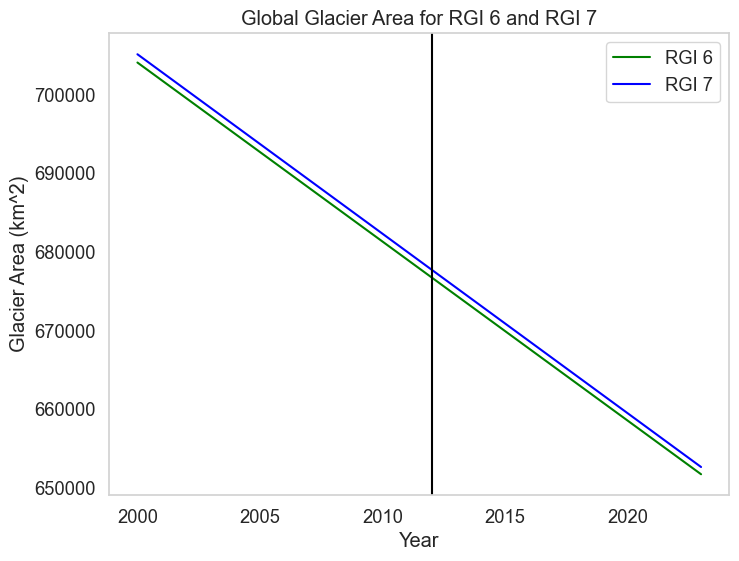

In [130]:


plt.figure(figsize = (8,6))

plt.plot(global_rgi6.start_dates, global_rgi6.glacier_area, color='green', label = 'RGI 6' )
plt.plot(global_rgi7.start_dates, global_rgi7.glacier_area, color='blue', label = 'RGI 7')

plt.axvline(x= 2012, color='black' )

plt.title('Global Glacier Area for RGI 6 and RGI 7')

plt.xlabel('Year')
plt.ylabel('Glacier Area (km^2)')
plt.legend()
plt.show

#plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/RGI6 vs 7 plots/global_glacier_area_shape.png')

In [129]:
#load global datasets
new_zealand_rgi6 = pd.read_csv(os.path.join(d_dir_rgi6, '18_new_zealand.csv')).drop('Unnamed: 0', axis=1)
new_zealand_rgi7 = pd.read_csv(os.path.join(d_dir_rgi7, '18_new_zealand.csv')).drop('Unnamed: 0', axis=1)

new_zealand_rgi6.head()
new_zealand_rgi7.head()

,start_dates,end_dates,glacier_area,region,combined_gt,combined_gt_errors,combined_mwe,combined_mwe_errors
0,2000.0,2001.0,748.4485,new_zealand,0.067079,0.451181,0.089893,0.510751
1,2001.0,2002.0,742.3351,new_zealand,-0.717320,0.481134,-0.969209,0.543159
2,2002.0,2003.0,736.2217,new_zealand,-0.778402,0.490248,-1.060474,0.553240
3,2003.0,2004.0,730.1083,new_zealand,-1.129685,0.508446,-1.551940,0.572031
4,2004.0,2005.0,723.9949,new_zealand,-0.407720,0.396718,-0.564848,0.448517


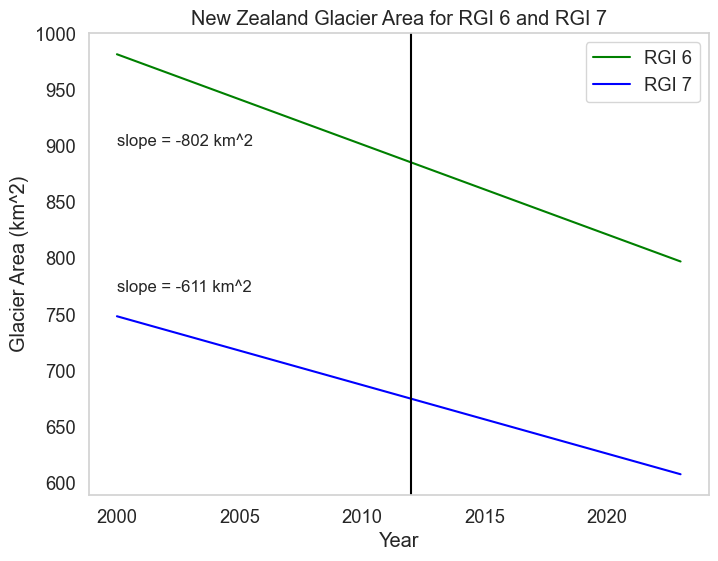

In [168]:
slope_6 = regions.REGIONS['new_zealand'].rgi6_area * regions.REGIONS['new_zealand'].area_change
slope_7 = regions.REGIONS['new_zealand'].rgi7_area * regions.REGIONS['new_zealand'].area_change


plt.figure(figsize = (8,6))

plt.plot(new_zealand_rgi6.start_dates, new_zealand_rgi6.glacier_area, color='green', label = 'RGI 6' )
plt.plot(new_zealand_rgi7.start_dates, new_zealand_rgi7.glacier_area, color='blue', label = 'RGI 7')

plt.axvline(x= 2012, color='black' )
plt.text(2000, 900, f"slope = {slope_6:.0f} km^2", fontsize=12)
plt.text(2000, 770, f"slope = {slope_7:.0f} km^2", fontsize=12)

plt.title('New Zealand Glacier Area for RGI 6 and RGI 7')
plt.xlabel('Year')
plt.ylabel('Glacier Area (km^2)')
plt.legend()
plt.show

plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/RGI6 vs 7 plots/new_zealand_glacier_area_shape.png')

## calculations

In [85]:
#merge 
global_merged = global_rgi6.merge( global_rgi7, on= ('start_dates', 'end_dates', 'region'),suffixes=('_rgi6', '_rgi7'), copy = False)
global_merged.head()

#calculate difference
global_merged['gt_difference'] = global_merged.combined_gt_rgi7 - global_merged.combined_gt_rgi6
global_merged['gt_errors_difference'] = global_merged.combined_gt_errors_rgi7 - global_merged.combined_gt_errors_rgi6

global_merged['mwe_difference'] = global_merged.combined_mwe_rgi7 - global_merged.combined_mwe_rgi6
global_merged['mwe_errors_difference'] = np.abs(global_merged.combined_mwe_errors_rgi7 - global_merged.combined_mwe_errors_rgi6)

global_merged.head()


,start_dates,end_dates,glacier_area_rgi6,region,combined_gt_rgi6,combined_gt_errors_rgi6,combined_mwe_rgi6,combined_mwe_errors_rgi6,glacier_area_rgi7,combined_gt_rgi7,combined_gt_errors_rgi7,combined_mwe_rgi7,combined_mwe_errors_rgi7,gt_difference,gt_errors_difference,mwe_difference,mwe_errors_difference
0,2000.0,2001.0,704082.69565,global,-78.044147,111.560951,-0.111179,0.158362,705135.8356,-79.794057,111.765892,-0.113502,0.158404,-1.749910,0.204941,-0.002323,0.000042
1,2001.0,2002.0,701805.49875,global,-215.169311,95.300101,-0.307516,0.135050,702852.8942,-216.268236,95.338491,-0.308626,0.134888,-1.098925,0.038390,-0.001110,0.000162
2,2002.0,2003.0,699528.30185,global,-128.466367,91.146345,-0.184200,0.128930,700569.9528,-128.809432,91.305161,-0.184417,0.128948,-0.343065,0.158817,-0.000217,0.000018
3,2003.0,2004.0,697251.10495,global,-192.672470,72.798877,-0.277163,0.102895,698287.0114,-191.324236,72.893165,-0.274815,0.102864,1.348233,0.094288,0.002348,0.000031
4,2004.0,2005.0,694973.90805,global,-229.236911,73.022158,-0.330842,0.102844,696004.0700,-230.641957,73.022336,-0.332377,0.102673,-1.405046,0.000178,-0.001535,0.000170


In [86]:
#calculate cumulative change
cum_global_rgi6 = derivative_to_cumulative(global_rgi6.start_dates, global_rgi6.end_dates, global_rgi6.combined_gt)
cum_err_global_rgi6 = derivative_to_cumulative(global_rgi6.start_dates, global_rgi6.end_dates, global_rgi6.combined_gt_errors, calculate_as_errors=True)

cum_global_rgi7 = derivative_to_cumulative(global_rgi7.start_dates, global_rgi7.end_dates, global_rgi7.combined_gt)
cum_err_global_rgi7 = derivative_to_cumulative(global_rgi7.start_dates, global_rgi7.end_dates, global_rgi7.combined_gt_errors, calculate_as_errors=True)

#merge & calc diff
cum_global_difference = cum_global_rgi6.merge(cum_global_rgi7, on='dates',suffixes=('_rgi6', '_rgi7'), copy = False)
cum_global_difference['diff'] = cum_global_difference.changes_rgi7 - cum_global_difference.changes_rgi6

cum_global_err = cum_err_global_rgi6.merge(cum_err_global_rgi7, on='dates',suffixes=('_rgi6', '_rgi7'), copy = False)
cum_global_err['err'] = cum_global_err.errors_rgi7 - cum_global_err.errors_rgi6

cum_global_difference.head()
#cum_global_err.head()

,dates,changes_rgi6,changes_rgi7,diff
0,2000.0,0.000000,0.000000,0.000000
1,2001.0,-78.044147,-79.794057,-1.749910
2,2002.0,-293.213458,-296.062293,-2.848835
3,2003.0,-421.679826,-424.871726,-3.191900
4,2004.0,-614.352295,-616.195962,-1.843667


In [87]:
#calculate difference cum change
cum_global_diff = derivative_to_cumulative(global_merged.start_dates, global_merged.end_dates, global_merged.gt_difference)
cum_err_global_diff = derivative_to_cumulative(global_merged.start_dates, global_merged.end_dates, global_merged.gt_errors_difference, calculate_as_errors=True)
cum_global_diff
global_merged

,start_dates,end_dates,glacier_area_rgi6,region,combined_gt_rgi6,combined_gt_errors_rgi6,combined_mwe_rgi6,combined_mwe_errors_rgi6,glacier_area_rgi7,combined_gt_rgi7,combined_gt_errors_rgi7,combined_mwe_rgi7,combined_mwe_errors_rgi7,gt_difference,gt_errors_difference,mwe_difference,mwe_errors_difference
0,2000.0,2001.0,704082.69565,global,-78.044147,111.560951,-0.111179,0.158362,705135.8356,-79.794057,111.765892,-0.113502,0.158404,-1.749910,0.204941,-0.002323,0.000042
1,2001.0,2002.0,701805.49875,global,-215.169311,95.300101,-0.307516,0.135050,702852.8942,-216.268236,95.338491,-0.308626,0.134888,-1.098925,0.038390,-0.001110,0.000162
2,2002.0,2003.0,699528.30185,global,-128.466367,91.146345,-0.184200,0.128930,700569.9528,-128.809432,91.305161,-0.184417,0.128948,-0.343065,0.158817,-0.000217,0.000018
3,2003.0,2004.0,697251.10495,global,-192.672470,72.798877,-0.277163,0.102895,698287.0114,-191.324236,72.893165,-0.274815,0.102864,1.348233,0.094288,0.002348,0.000031
4,2004.0,2005.0,694973.90805,global,-229.236911,73.022158,-0.330842,0.102844,696004.0700,-230.641957,73.022336,-0.332377,0.102673,-1.405046,0.000178,-0.001535,0.000170
5,2005.0,2006.0,692696.71115,global,-315.037176,74.190658,-0.456167,0.104458,693721.1286,-312.358908,74.243077,-0.451621,0.104364,2.678268,0.052419,0.004546,0.000094
6,2006.0,2007.0,690419.51425,global,-279.889874,72.773170,-0.406611,0.102514,691438.1872,-280.501837,72.872941,-0.406900,0.102484,-0.611963,0.099771,-0.000289,0.000030
7,2007.0,2008.0,688142.31735,global,-323.165709,71.785097,-0.471034,0.101036,689155.2458,-323.772187,71.873201,-0.471224,0.100990,-0.606478,0.088104,-0.000190,0.000046
8,2008.0,2009.0,685865.12045,global,-178.632482,71.861847,-0.261232,0.101121,686872.3044,-179.198845,71.940067,-0.261676,0.101058,-0.566363,0.078220,-0.000444,0.000063
9,2009.0,2010.0,683587.92355,global,-231.238124,71.293545,-0.339289,0.100102,684589.3630,-230.811081,71.388173,-0.338167,0.100063,0.427044,0.094628,0.001122,0.000040


## plots

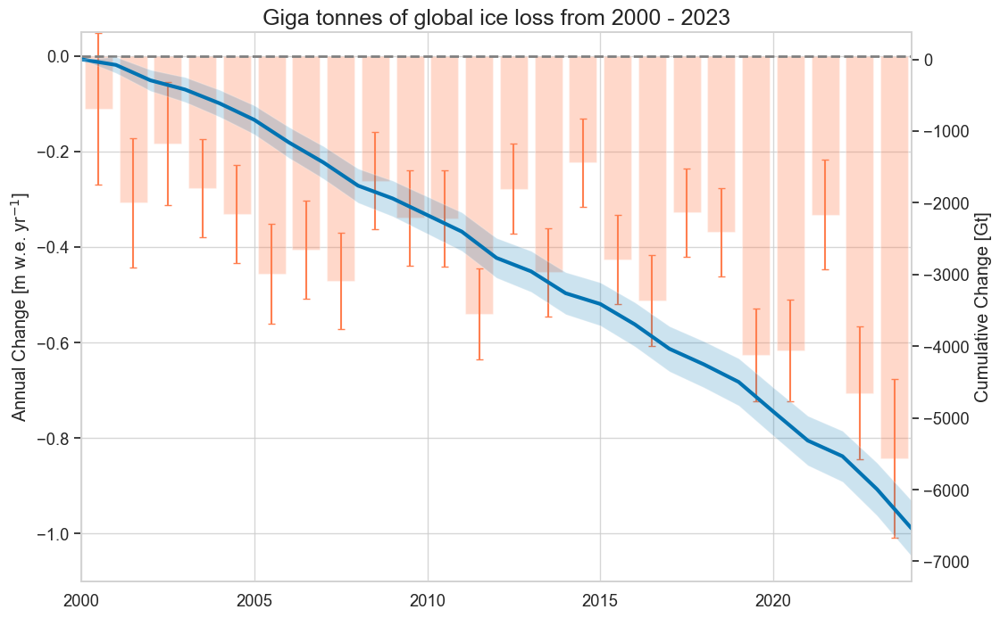

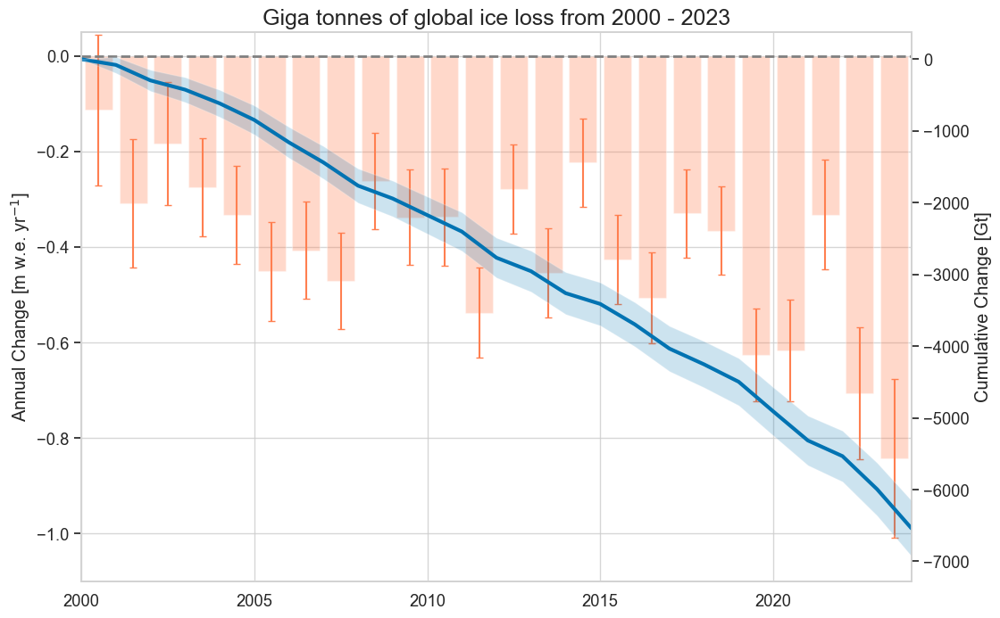

In [88]:
global_cumulative_plot(cum_global_rgi6, cum_err_global_rgi6, global_rgi6, 'Gt')
global_cumulative_plot(cum_global_rgi7, cum_err_global_rgi7, global_rgi7, 'Gt')

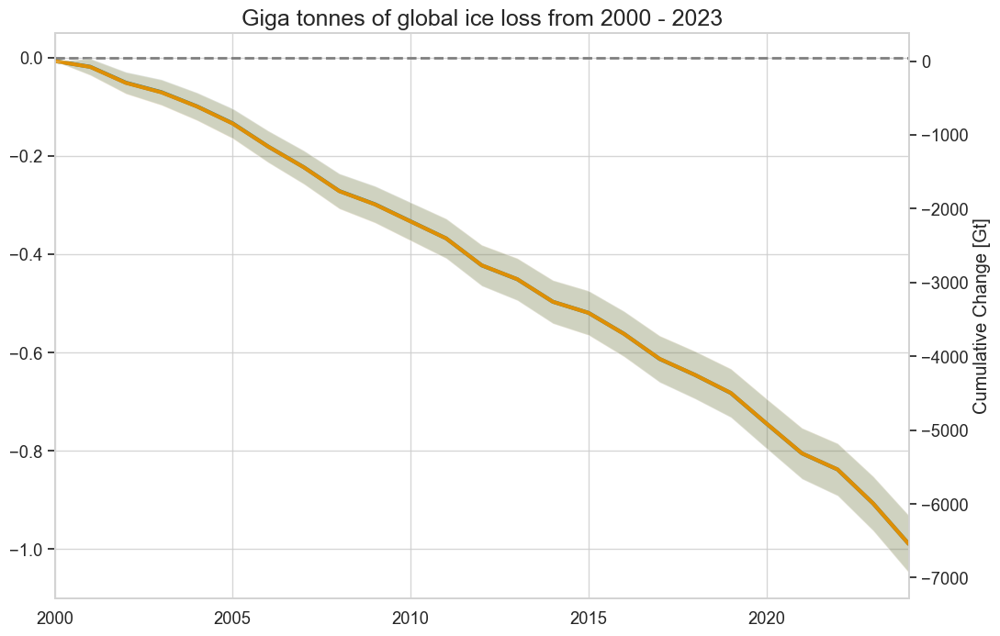

In [89]:
#plot teh two cumulative global plots
fig, axs = plt.subplots(1, 1, figsize=(12,8))

axs.set_ylim(-1.1, 0.05)
axs.set_xlim(2000,2024)
axs_2 = axs.twinx()  
    
axs.hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

#rgi6

axs_2.plot(cum_global_rgi6.dates, cum_global_rgi6.changes, linewidth=3, zorder=2)
axs_2.fill_between(cum_global_rgi6.dates, cum_global_rgi6.changes - cum_err_global_rgi6.errors, cum_global_rgi6.changes + cum_err_global_rgi6.errors, alpha=0.2, zorder=2)

#rgi7
axs_2.plot(cum_global_rgi7.dates, cum_global_rgi7.changes, linewidth=3, zorder=2)
axs_2.fill_between(cum_global_rgi7.dates, cum_global_rgi7.changes - cum_err_global_rgi7.errors, cum_global_rgi7.changes + cum_err_global_rgi7.errors, alpha=0.2, zorder=2)



axs_2.set_xlabel('Year')
axs_2.set_ylabel('Cumulative Change [{}]'.format('Gt'))
axs_2.set_title('Giga tonnes of global ice loss from 2000 - 2023', fontsize=18)

axs.grid(True, alpha=0.8)

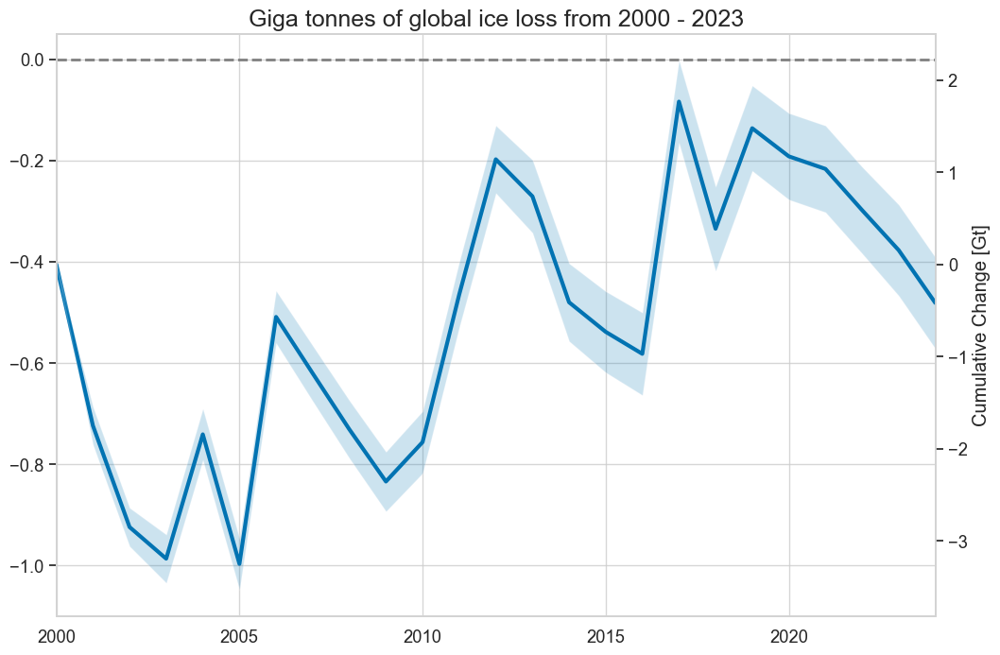

In [90]:
#plot cumulative differences (diff calculated before comulative
fig, axs = plt.subplots(1, 1, figsize=(12,8))

axs.set_ylim(-1.1, 0.05)
axs.set_xlim(2000,2024)
axs_2 = axs.twinx()  
    
axs.hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

#rgi6
#axs.bar(global_rgi6.start_dates+0.5, global_rgi6.combined_mwe, yerr=global_rgi6.combined_mwe_errors, capsize=3, color='coral', ecolor='coral', alpha=0.3, zorder=1) 
#axs.set_ylabel('Annual Change [m w.e. yr$^{-1}$]')

axs_2.plot(cum_global_diff.dates, cum_global_diff.changes, linewidth=3, zorder=2)
axs_2.fill_between(cum_global_diff.dates, cum_global_diff.changes - cum_err_global_diff.errors, cum_global_diff.changes + cum_err_global_diff.errors, alpha=0.2, zorder=2)




axs_2.set_xlabel('Year')
axs_2.set_ylabel('Cumulative Change [{}]'.format('Gt'))
axs_2.set_title('Giga tonnes of global ice loss from 2000 - 2023', fontsize=18)

axs.grid(True, alpha=0.8)

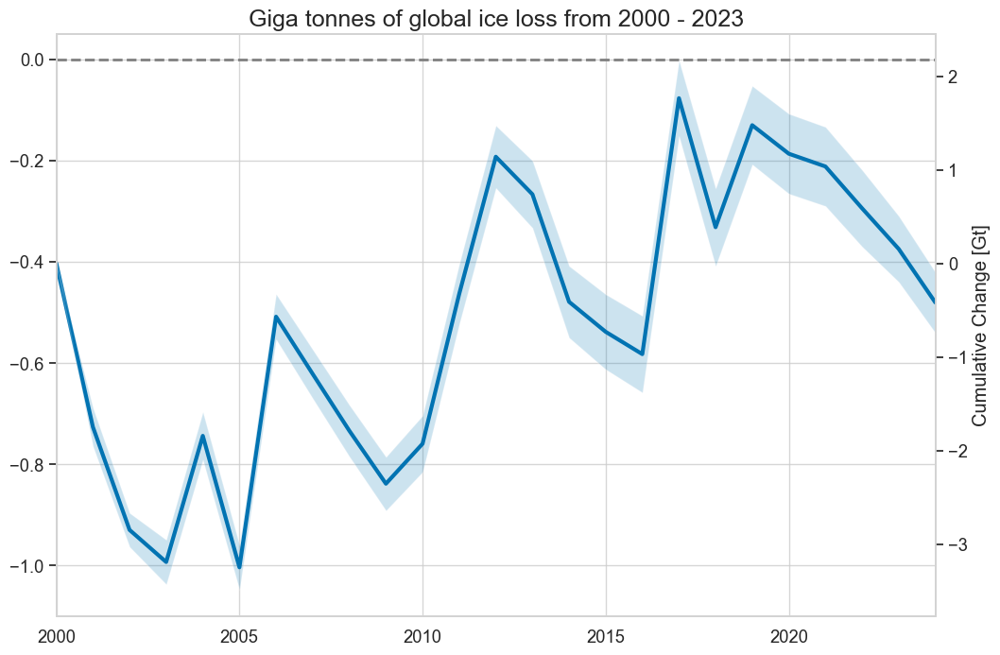

In [91]:
#plot cumulative differences (diff calculated after comulative
fig, axs = plt.subplots(1, 1, figsize=(12,8))

axs.set_ylim(-1.1, 0.05)
axs.set_xlim(2000,2024)
axs_2 = axs.twinx()  
    
axs.hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

#rgi6
#axs.bar(global_rgi6.start_dates+0.5, global_rgi6.combined_mwe, yerr=global_rgi6.combined_mwe_errors, capsize=3, color='coral', ecolor='coral', alpha=0.3, zorder=1) 
#axs.set_ylabel('Annual Change [m w.e. yr$^{-1}$]')

axs_2.plot(cum_global_difference.dates, cum_global_difference['diff'], linewidth=3, zorder=2)
axs_2.fill_between(cum_global_difference.dates, cum_global_difference['diff'] - cum_global_err.err, cum_global_difference['diff'] + cum_global_err.err, alpha=0.2, zorder=2)




axs_2.set_xlabel('Year')
axs_2.set_ylabel('Cumulative Change [{}]'.format('Gt'))
axs_2.set_title('Giga tonnes of global ice loss from 2000 - 2023', fontsize=18)

axs.grid(True, alpha=0.8)

## final difference plot

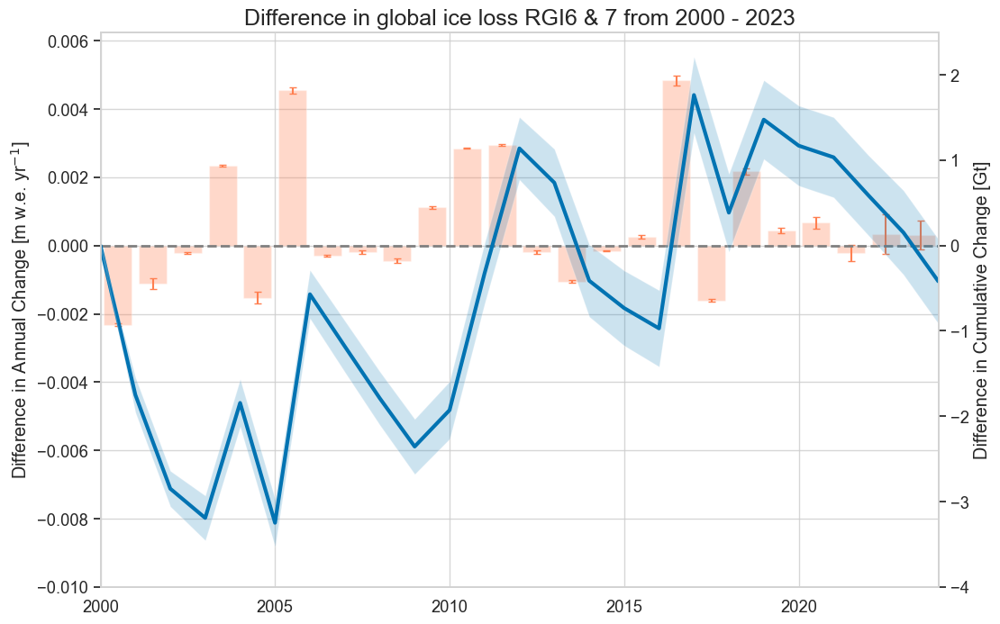

In [92]:
#plot cumulative differences (diff calculated before comulative
fig, axs = plt.subplots(1, 1, figsize=(12,8))

#axs.set_ylim(-0.02, 0.0125)
axs.set_ylim(-0.01, 0.00625)

axs.set_xlim(2000,2024)
axs_2 = axs.twinx()  
axs_2.set_ylim(-4, 2.5)

axs.hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')

#rgi6
axs.bar(global_merged.start_dates+0.5, global_merged.mwe_difference, yerr=global_merged.mwe_errors_difference, capsize=3, color='coral', ecolor='coral', alpha=0.3, zorder=1) 
axs.set_ylabel('Difference in Annual Change [m w.e. yr$^{-1}$]')

axs_2.plot(cum_global_diff.dates, cum_global_diff.changes, linewidth=3, zorder=2)
axs_2.fill_between(cum_global_diff.dates, cum_global_diff.changes - cum_err_global_diff.errors, cum_global_diff.changes + cum_err_global_diff.errors, alpha=0.2, zorder=2)




axs_2.set_xlabel('Year')
axs_2.set_ylabel('Difference in Cumulative Change [{}]'.format('Gt'))
axs_2.set_title('Difference in global ice loss RGI6 & 7 from 2000 - 2023', fontsize=18)

axs.grid(True, alpha=0.8)

#plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/RGI6 vs 7 plots/global_difference.png')

# regional comparison

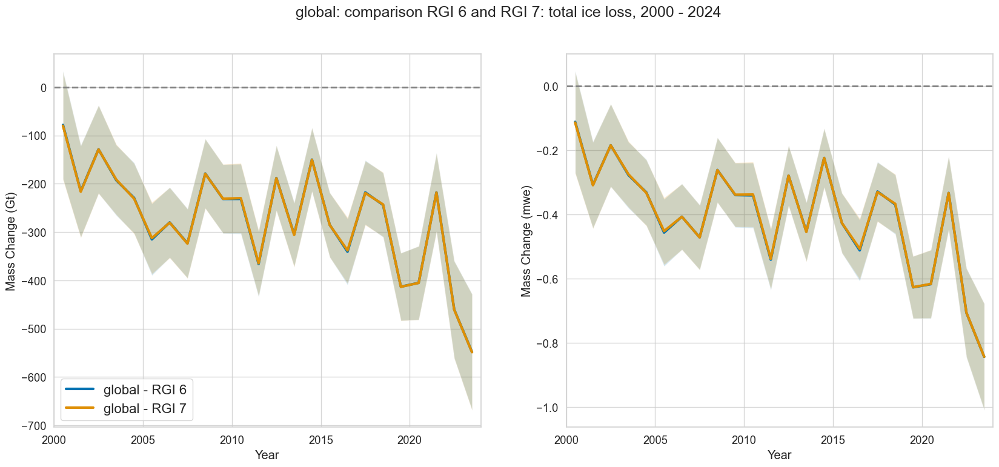

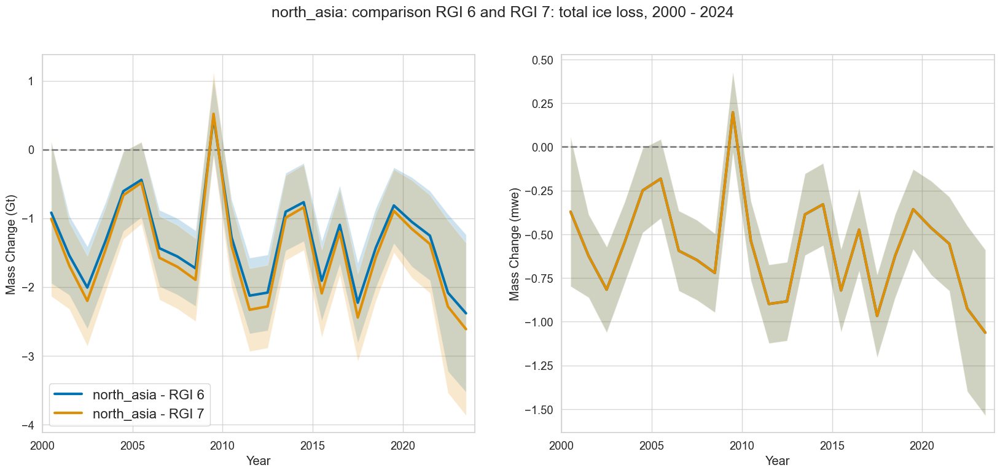

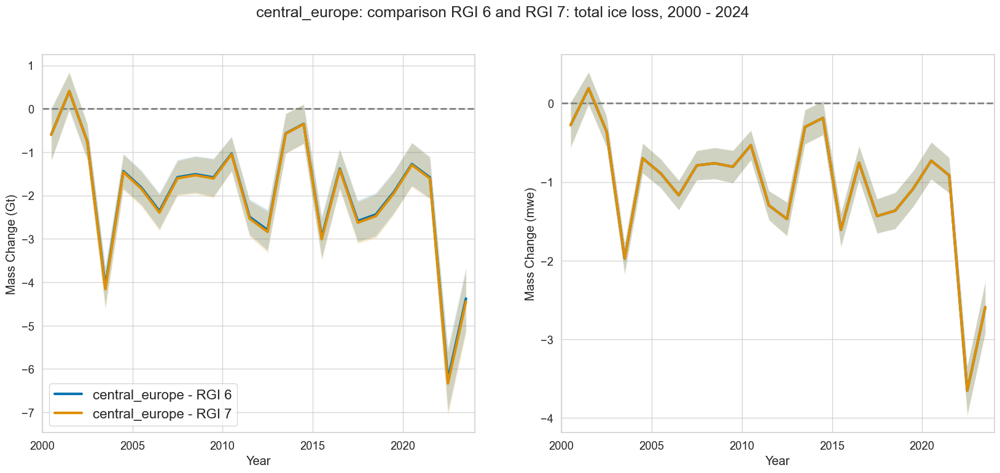

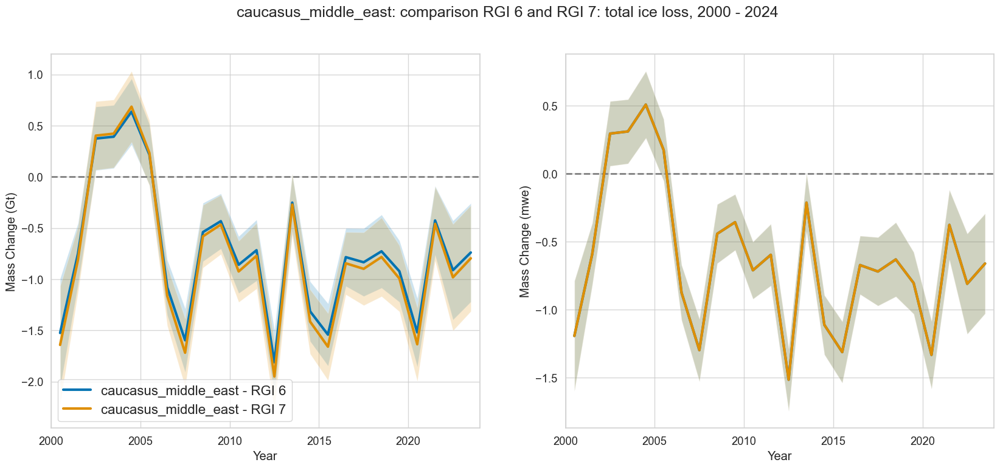

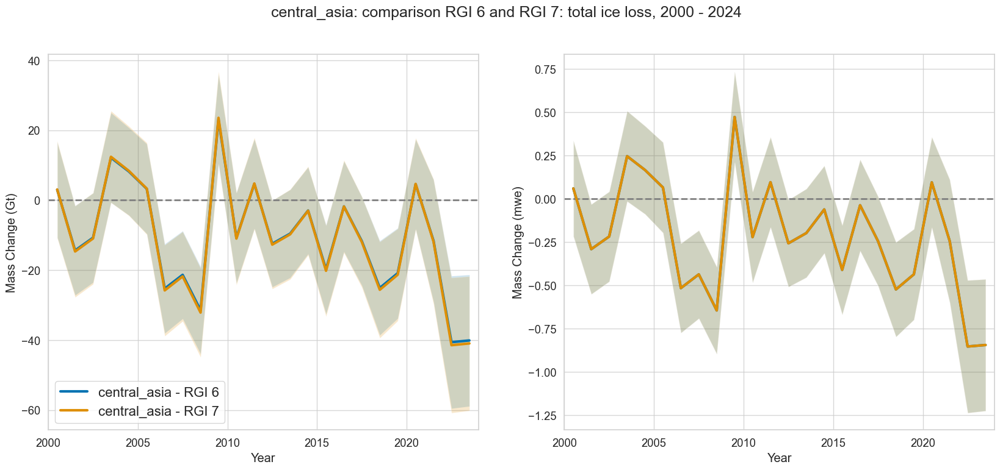

...

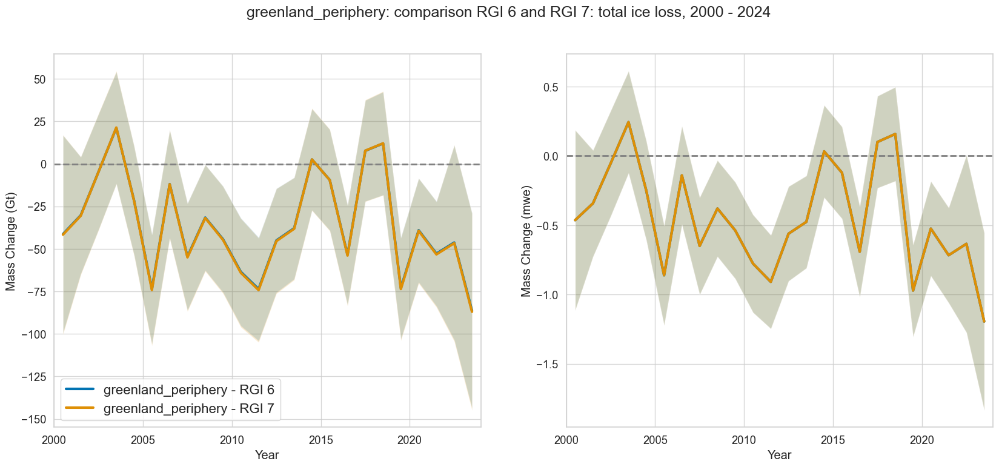

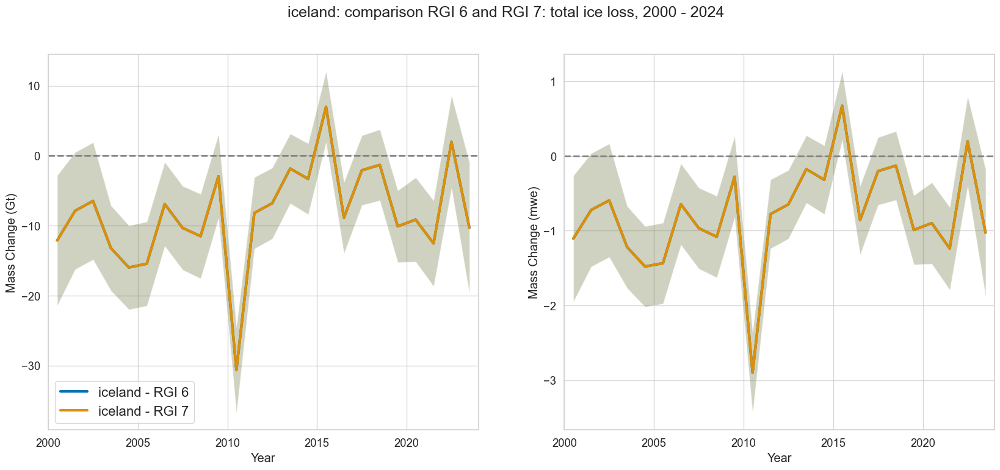

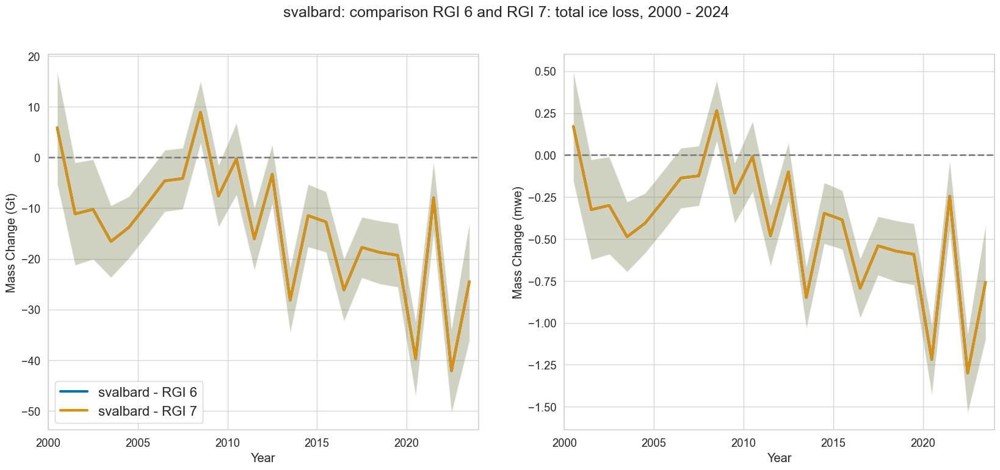

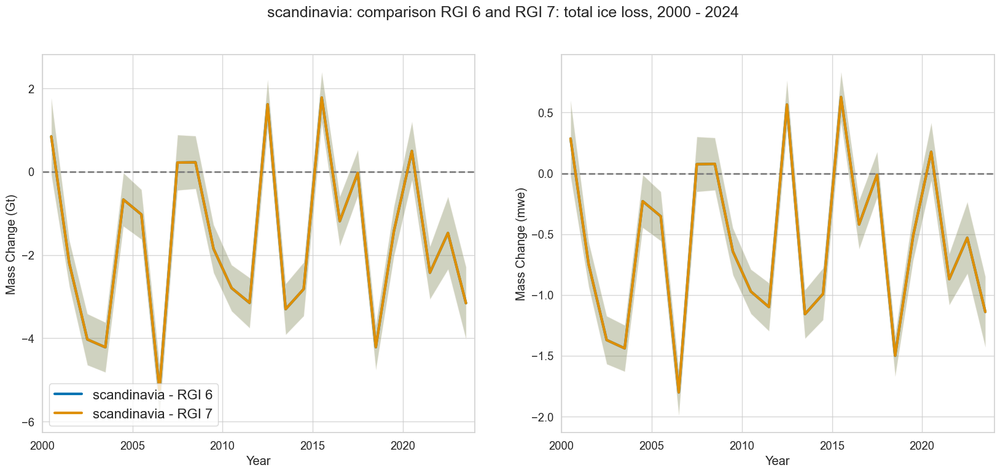

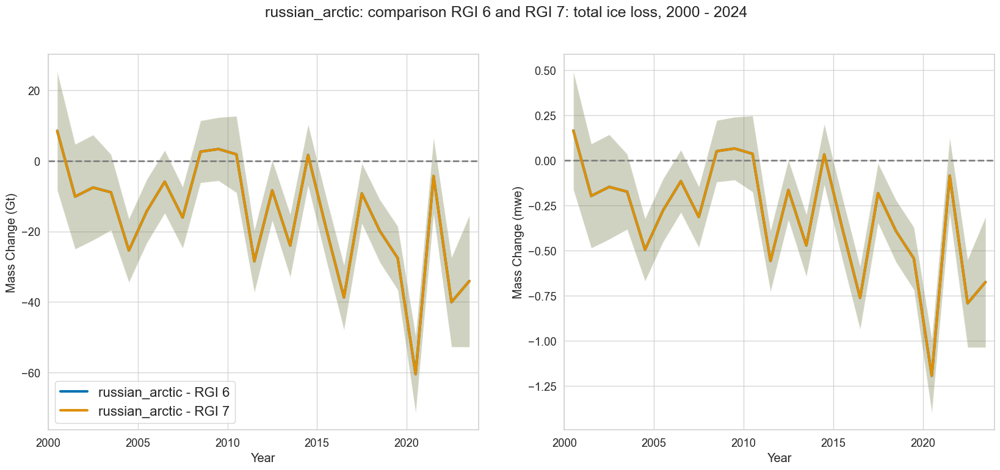

In [154]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_rgi6_df = pd.read_csv(os.path.join(d_dir_rgi6, region)).drop('Unnamed: 0', axis=1)
    region_rgi7_df = pd.read_csv(os.path.join(d_dir_rgi7, region)).drop('Unnamed: 0', axis=1)

    #plot
    two_runs_comparison_plot(region_name, 'RGI 6', 'RGI 7', region_rgi6_df, region_rgi7_df)

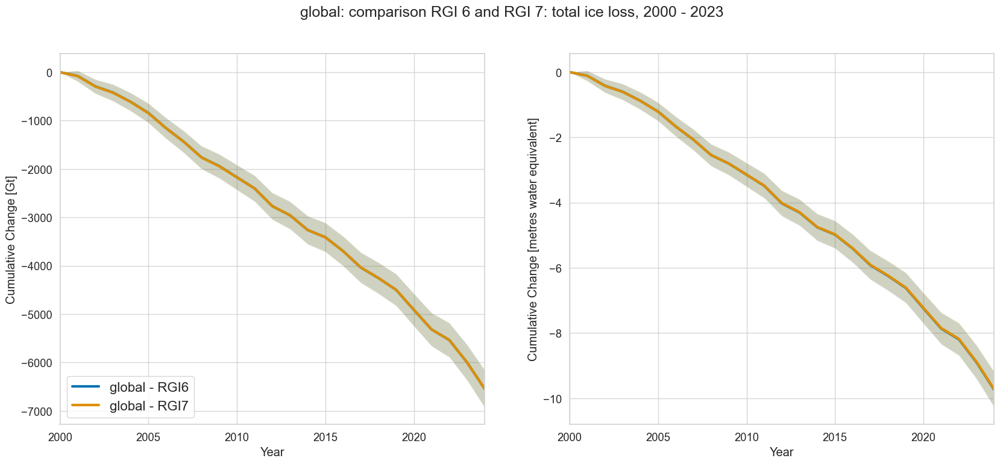

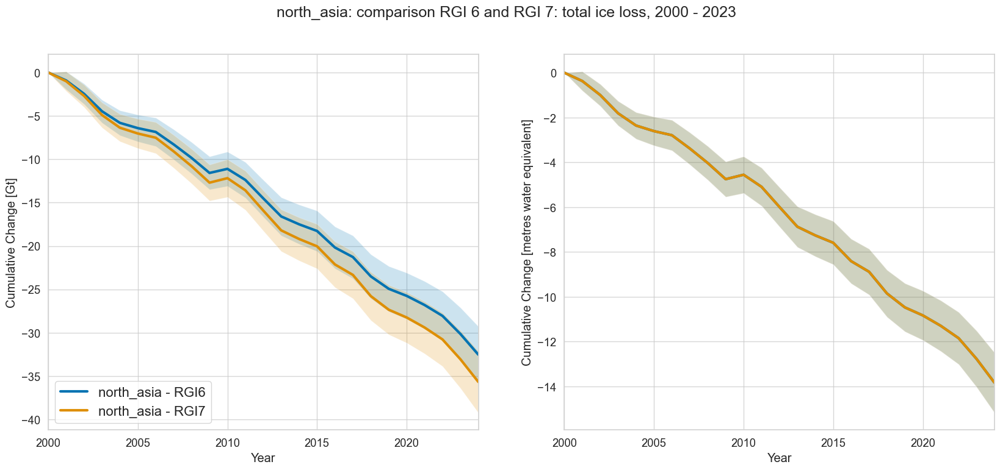

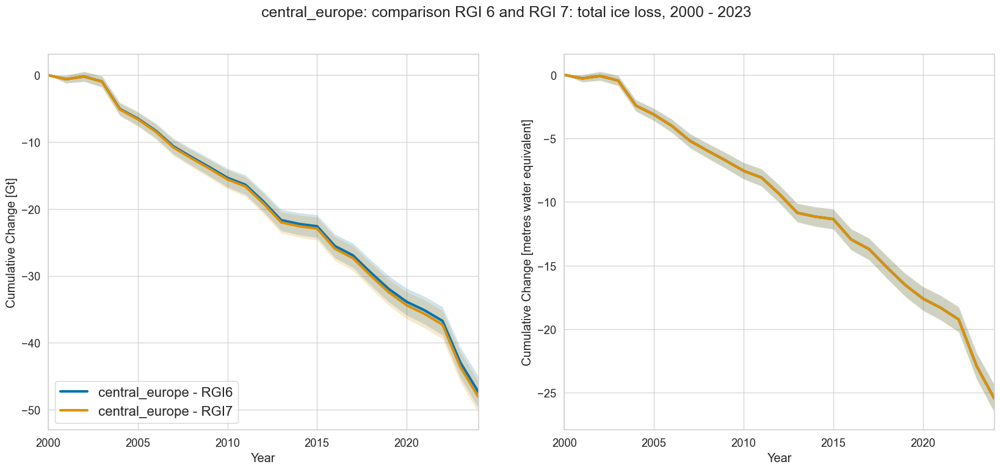

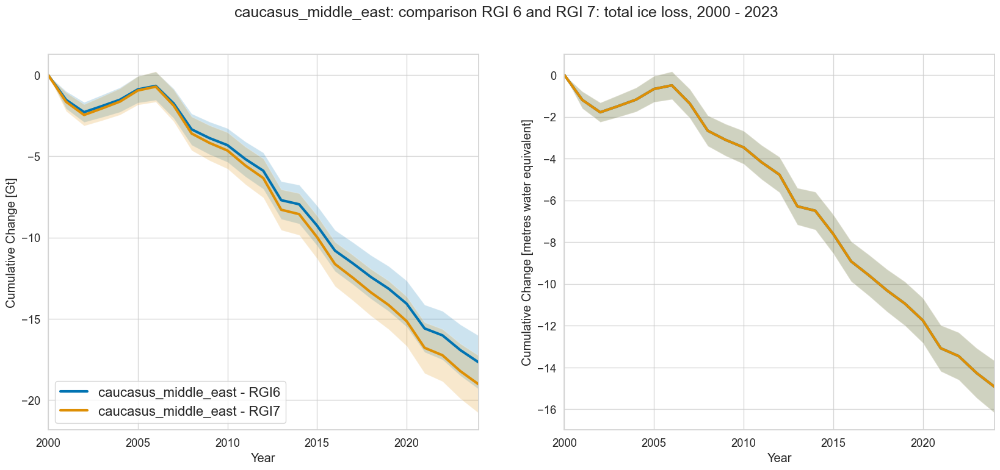

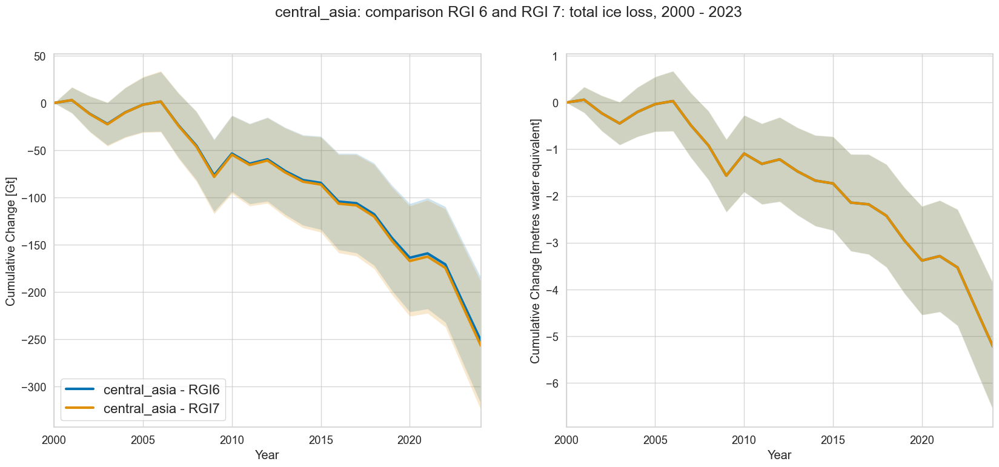

...

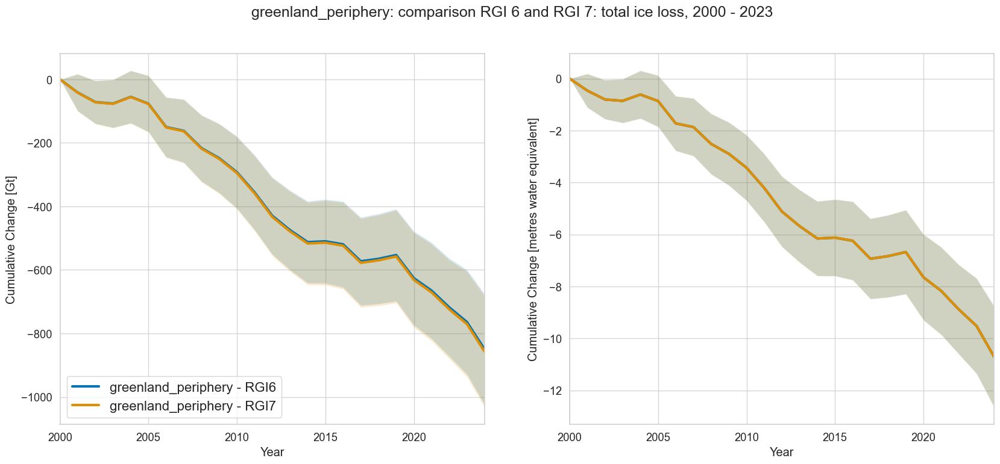

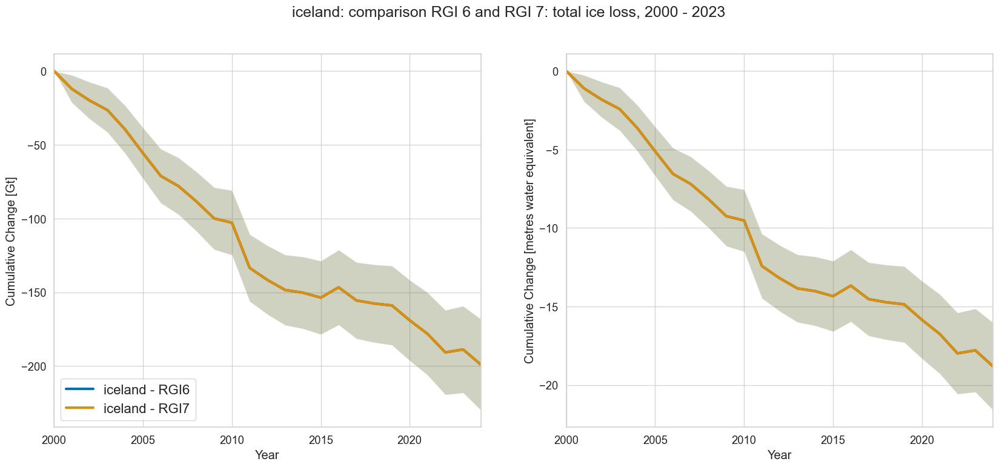

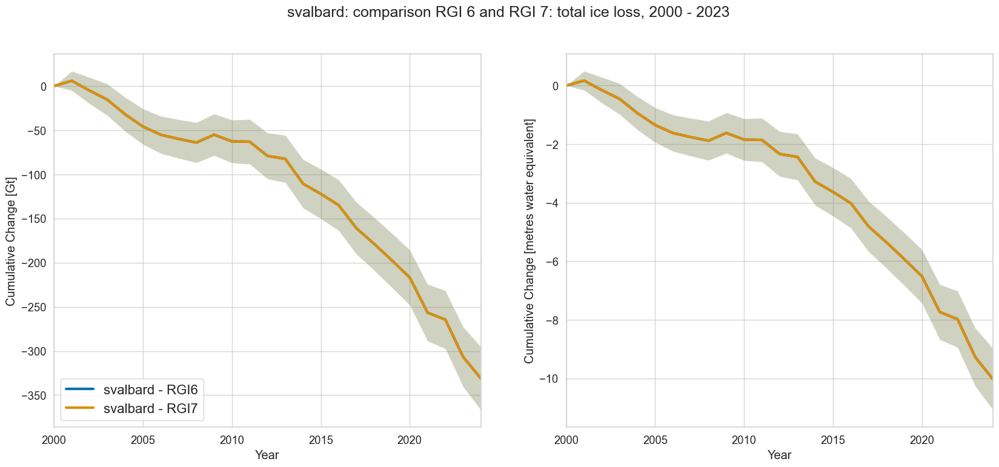

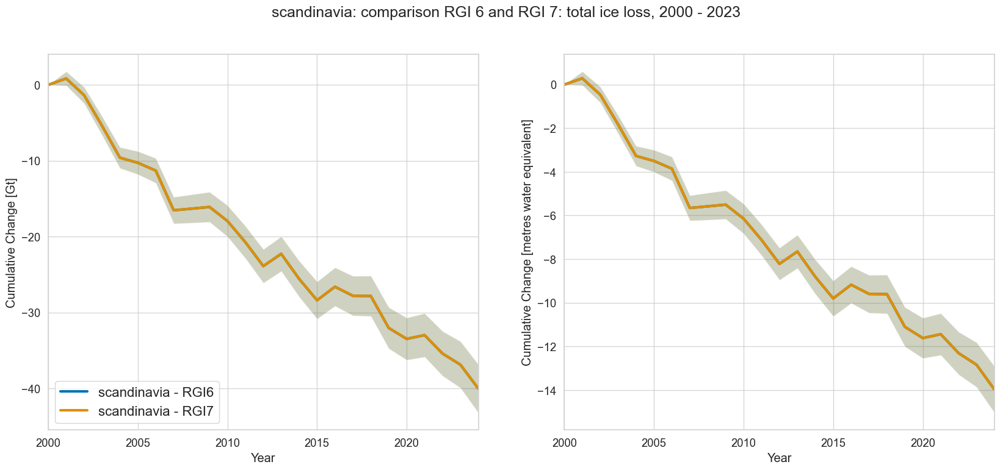

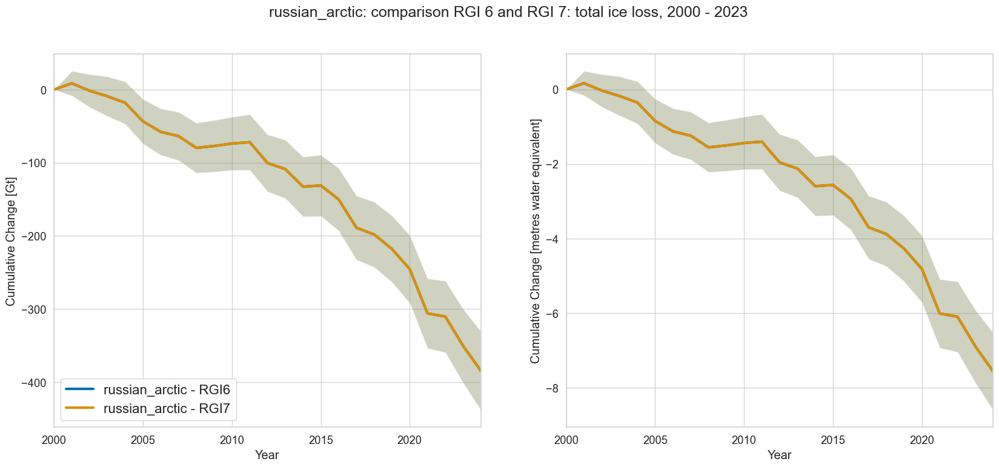

In [152]:


for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_rgi6 = pd.read_csv(os.path.join(d_dir_rgi6, region)).drop('Unnamed: 0', axis=1)
    region_rgi7 = pd.read_csv(os.path.join(d_dir_rgi7, region)).drop('Unnamed: 0', axis=1)

    #calculate cumulative for rgi6
    cum_region_gt_6 = derivative_to_cumulative(region_rgi6.start_dates, region_rgi6.end_dates, region_rgi6.combined_gt)
    cum_region_gt_err_6 = derivative_to_cumulative(region_rgi6.start_dates, region_rgi6.end_dates, region_rgi6.combined_gt_errors, calculate_as_errors=True)

    cum_region_mwe_6 = derivative_to_cumulative(region_rgi6.start_dates, region_rgi6.end_dates, region_rgi6.combined_mwe)
    cum_region_mwe_err_6 = derivative_to_cumulative(region_rgi6.start_dates, region_rgi6.end_dates, region_rgi6.combined_mwe_errors, calculate_as_errors=True)

    #calculate cumulative for rgi6
    cum_region_gt_7 = derivative_to_cumulative(region_rgi7.start_dates, region_rgi7.end_dates, region_rgi7.combined_gt)
    cum_region_gt_err_7 = derivative_to_cumulative(region_rgi7.start_dates, region_rgi7.end_dates, region_rgi7.combined_gt_errors, calculate_as_errors=True)

    cum_region_mwe_7 = derivative_to_cumulative(region_rgi7.start_dates, region_rgi7.end_dates, region_rgi7.combined_mwe)
    cum_region_mwe_err_7 = derivative_to_cumulative(region_rgi7.start_dates, region_rgi7.end_dates, region_rgi7.combined_mwe_errors, calculate_as_errors=True)

    #plot
    two_region_comparison_plot2(region_name, 'RGI6', 'RGI7', cum_region_gt_6, cum_region_gt_err_6, cum_region_gt_7,
                           cum_region_gt_err_7, cum_region_mwe_6, cum_region_mwe_err_6,
                           cum_region_mwe_7, cum_region_mwe_err_7)

    #save to folder
    #plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/RGI6 vs 7 plots/' + region_name + '_comparison.png')

    

# regional difference

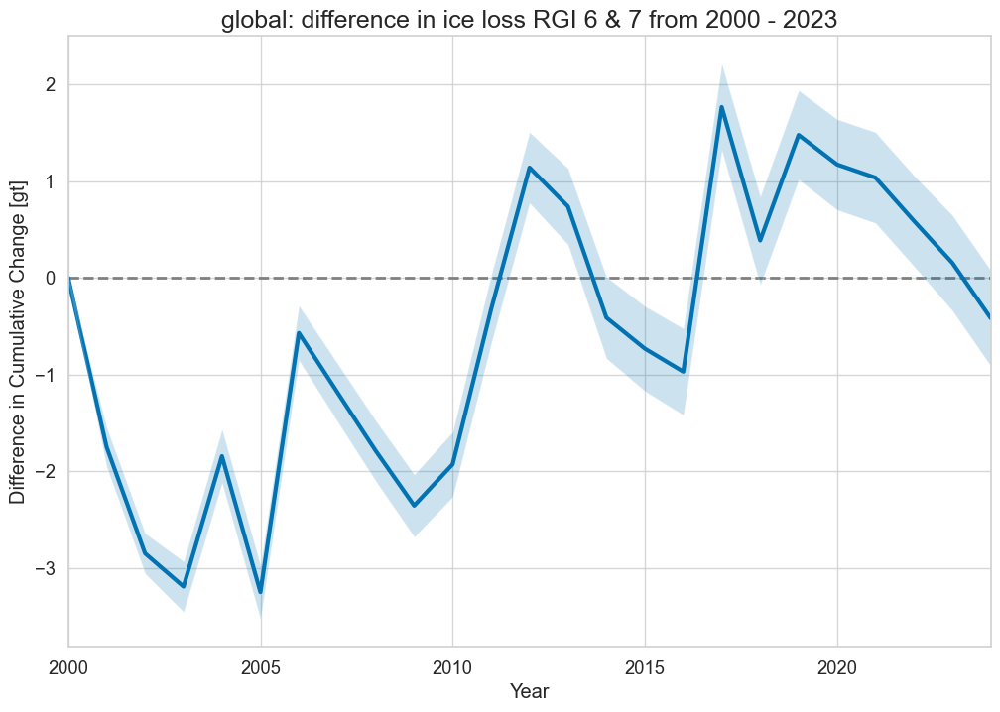

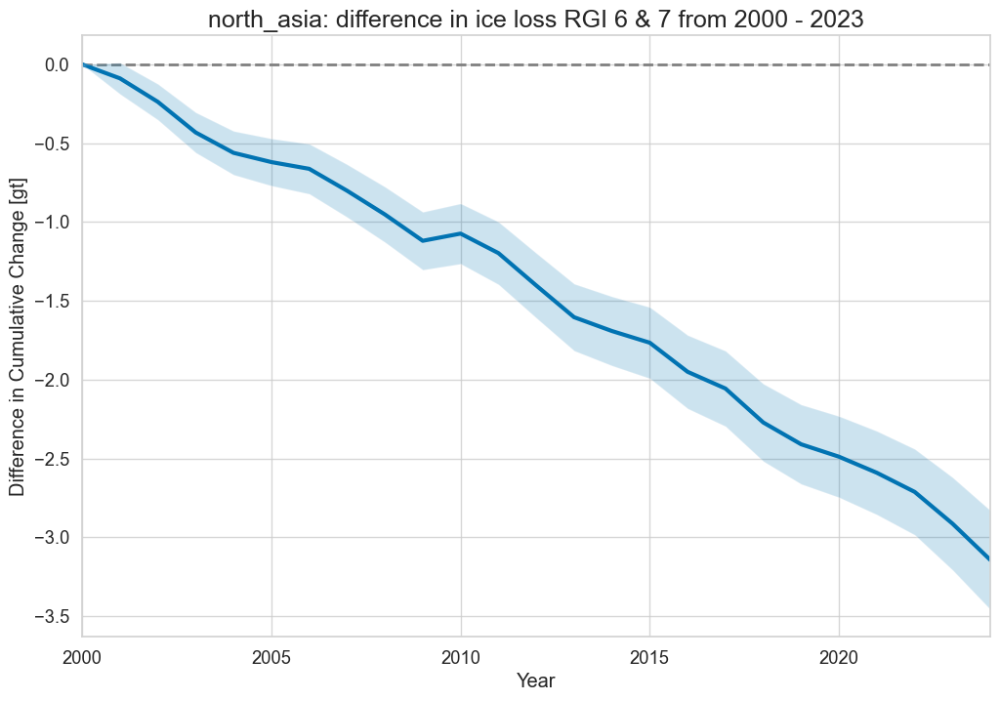

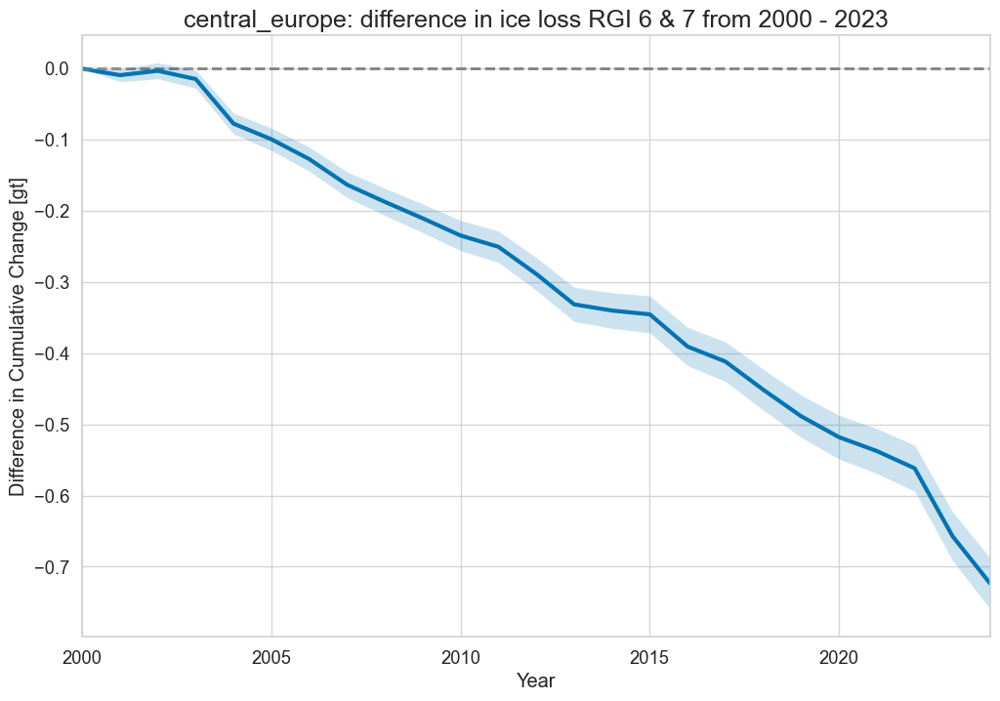

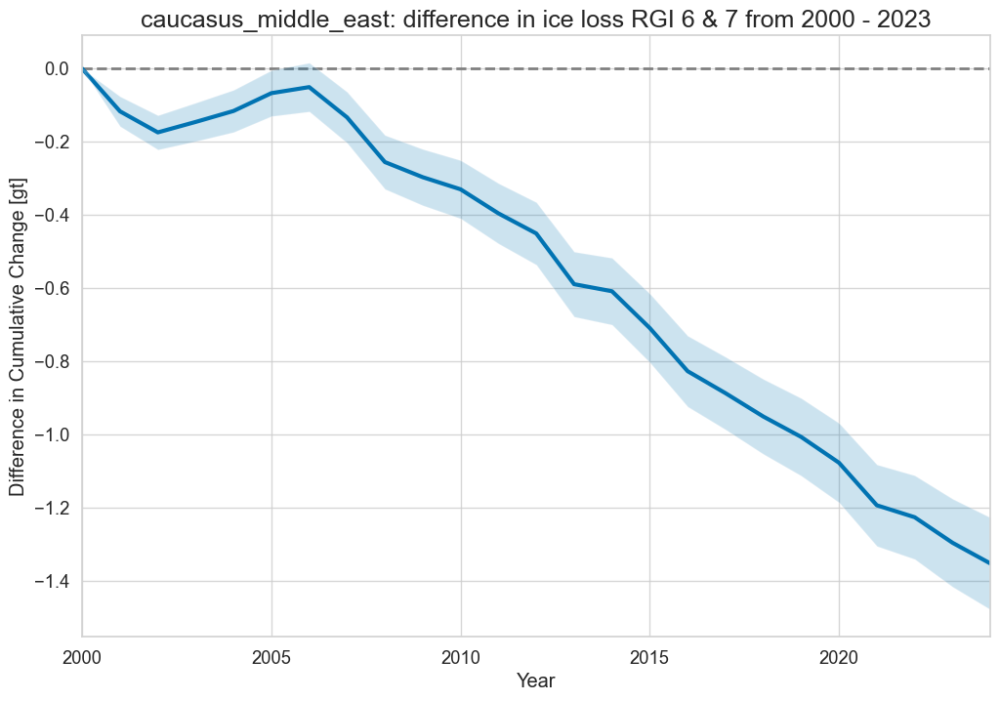

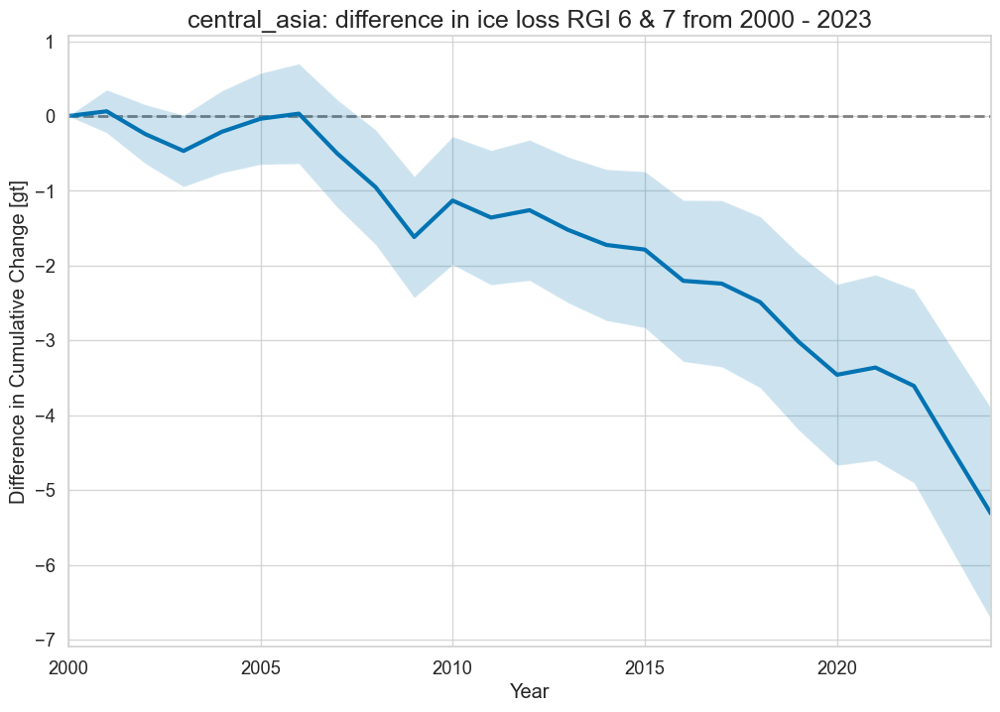

...

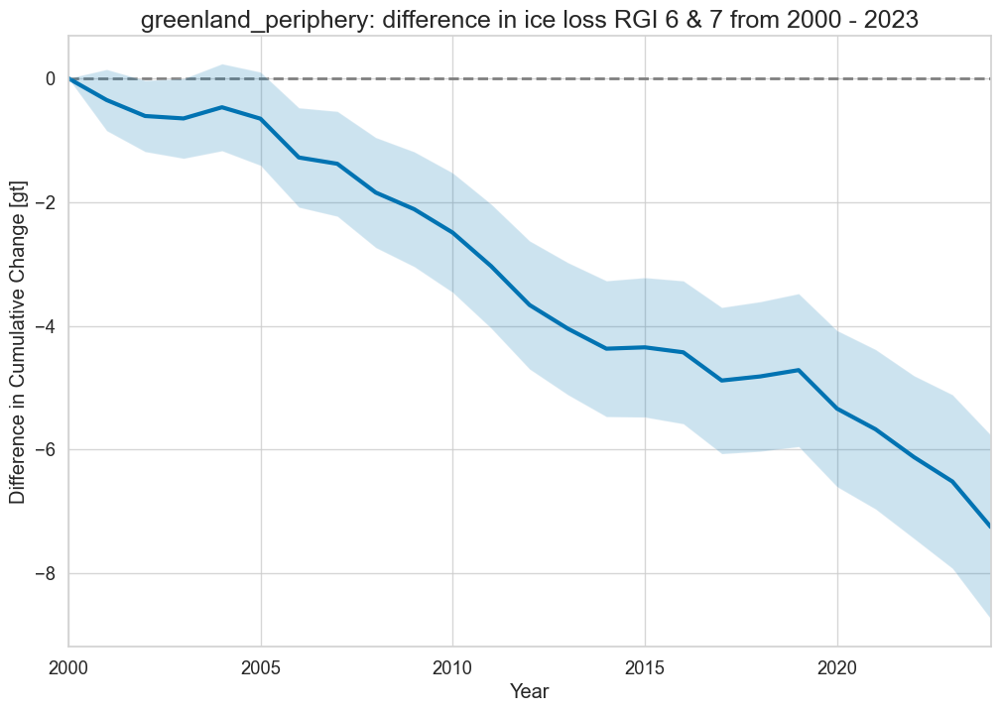

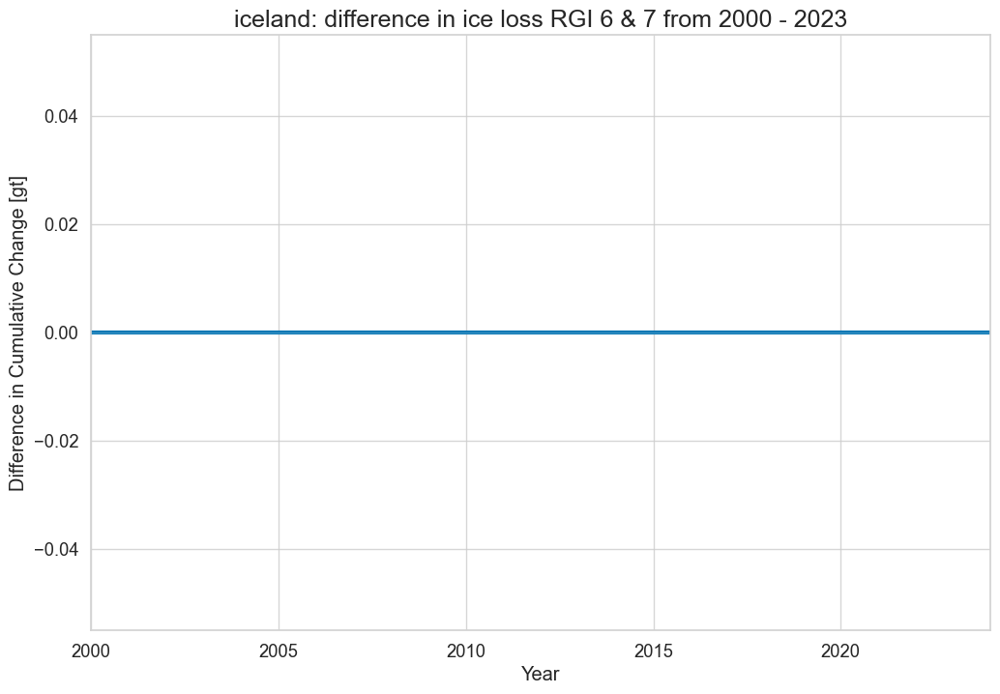

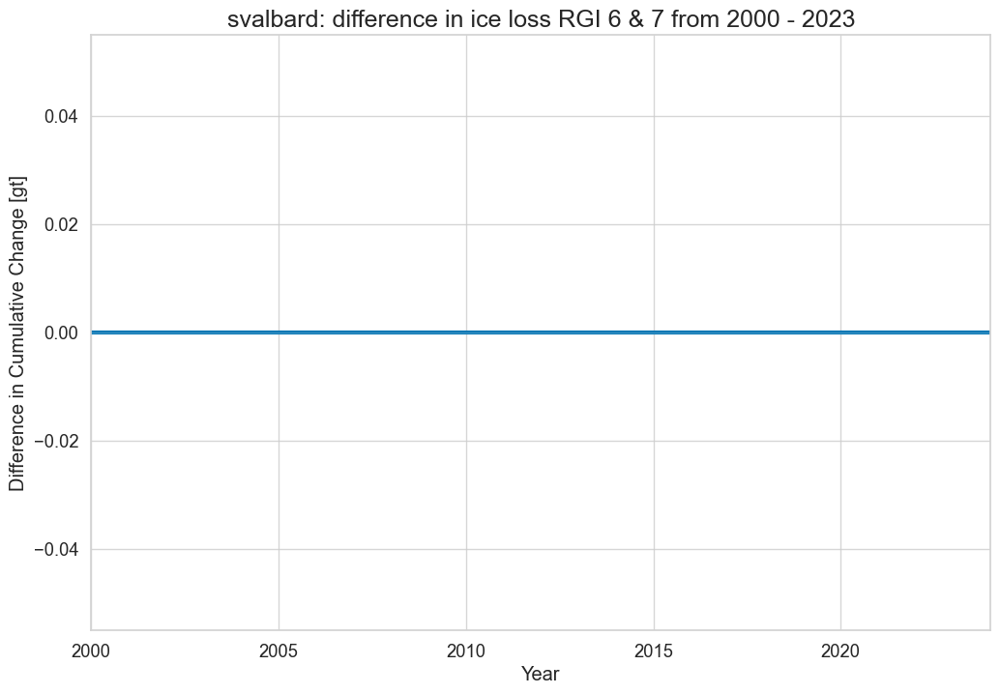

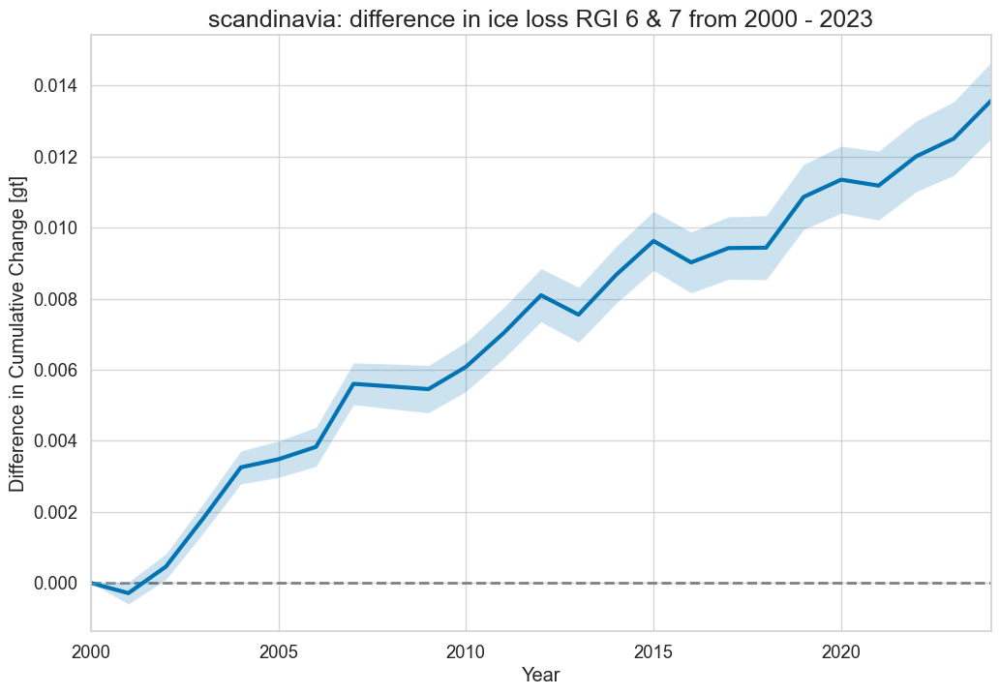

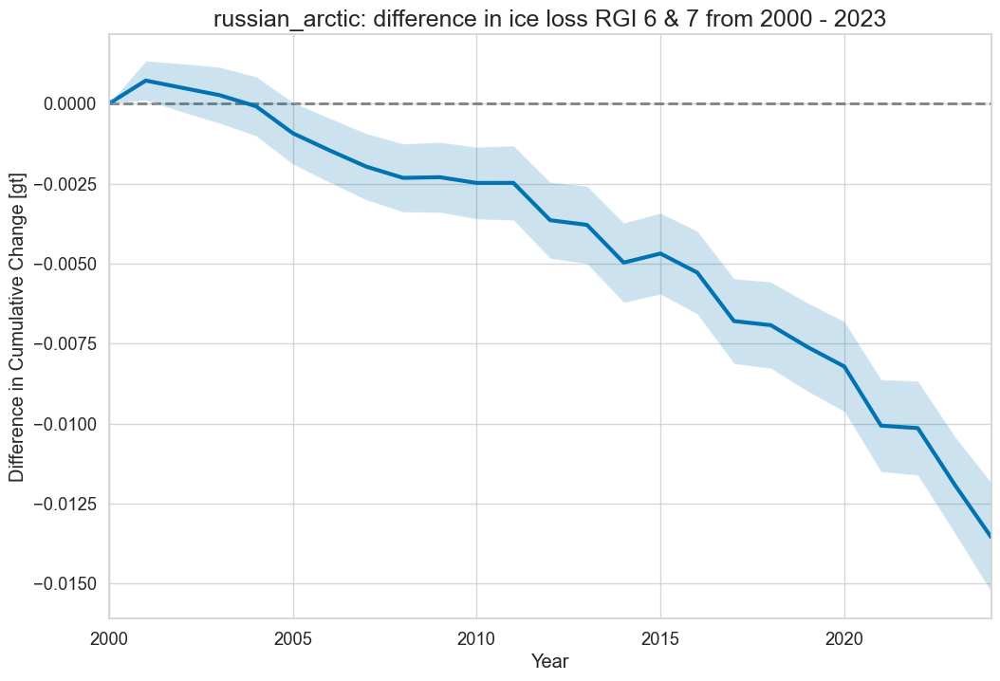

In [150]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_rgi6 = pd.read_csv(os.path.join(d_dir_rgi6, region)).drop('Unnamed: 0', axis=1)
    region_rgi7 = pd.read_csv(os.path.join(d_dir_rgi7, region)).drop('Unnamed: 0', axis=1)

    #merge 
    region_merged = region_rgi6.merge(region_rgi7, on= ('start_dates', 'end_dates', 'region'),suffixes=('_rgi6', '_rgi7'), copy = False)

    #calculate difference
    region_merged['gt_difference'] = region_merged.combined_gt_rgi7 - region_merged.combined_gt_rgi6
    region_merged['gt_errors_difference'] = region_merged.combined_gt_errors_rgi7 - region_merged.combined_gt_errors_rgi6

    region_merged['mwe_difference'] = region_merged.combined_mwe_rgi7 - region_merged.combined_mwe_rgi6
    region_merged['mwe_errors_difference'] = np.abs(region_merged.combined_mwe_errors_rgi7 - region_merged.combined_mwe_errors_rgi6)

    #calculate difference cum change
    cum_region_diff = derivative_to_cumulative(region_merged.start_dates, region_merged.end_dates, region_merged.gt_difference)
    cum_err_region_diff = derivative_to_cumulative(region_merged.start_dates, region_merged.end_dates, region_merged.gt_errors_difference, calculate_as_errors=True)

    #plot
    region_cumulative_plot2(region_name, cum_region_diff, cum_err_region_diff, region_merged, 'gt')

    #save to folder
    #plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/RGI6 vs 7 plots/' + region_name + '_difference.png')


# relative difference % 

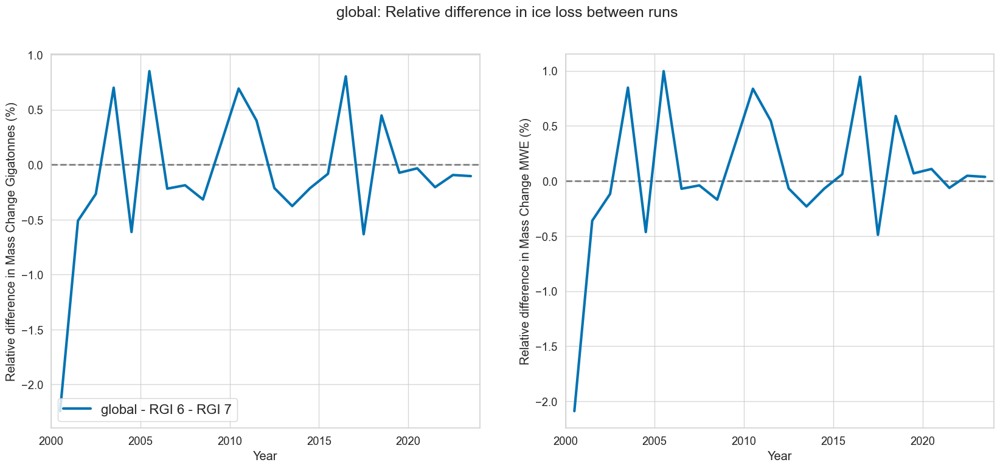

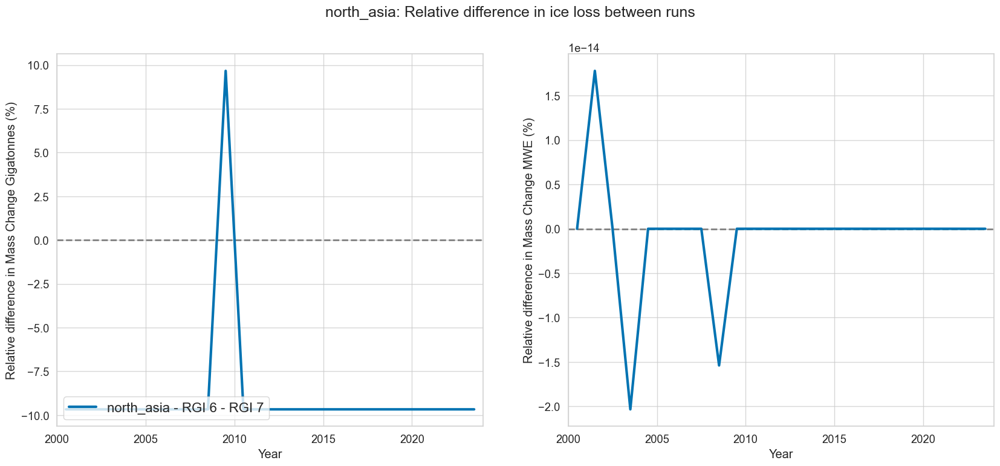

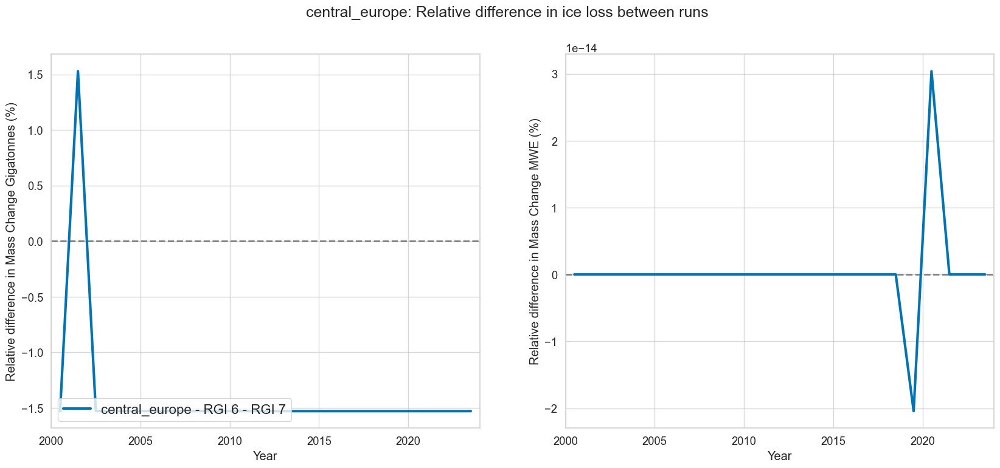

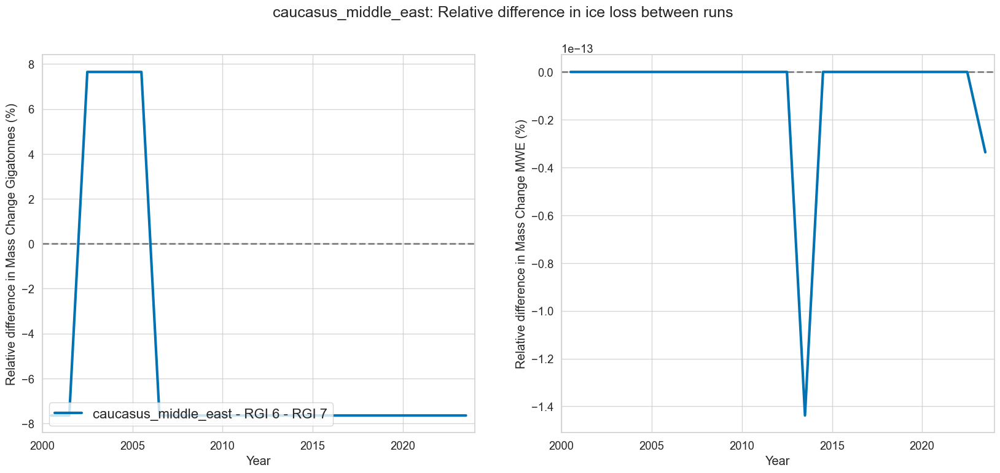

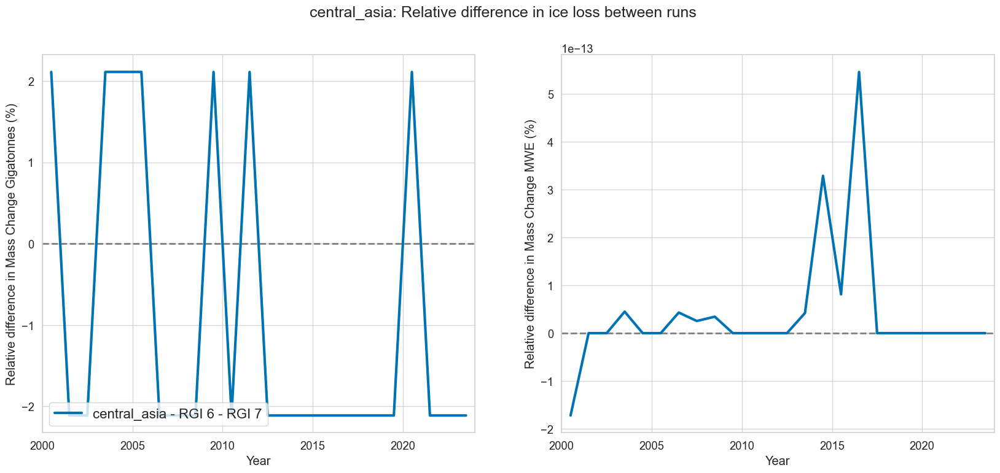

...

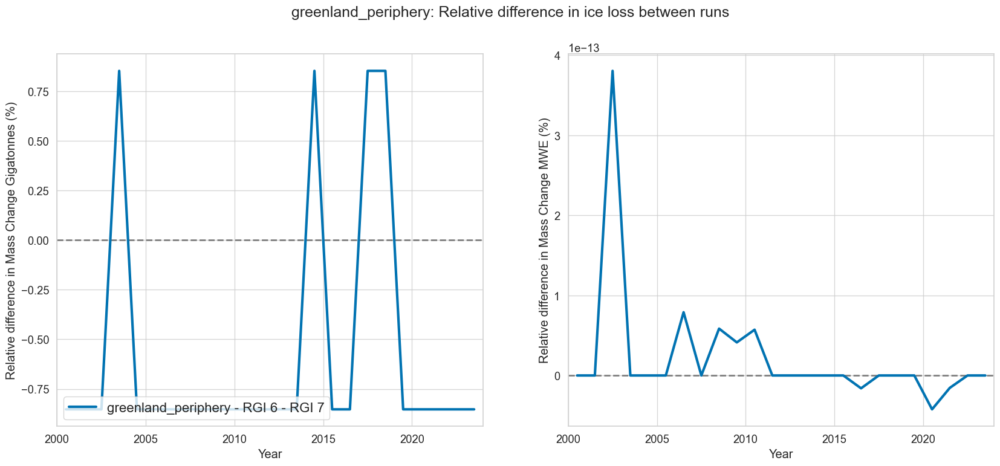

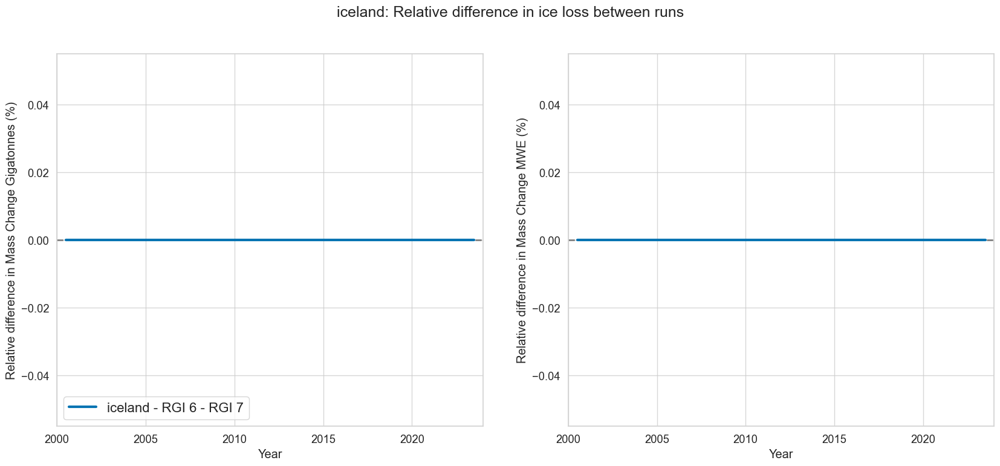

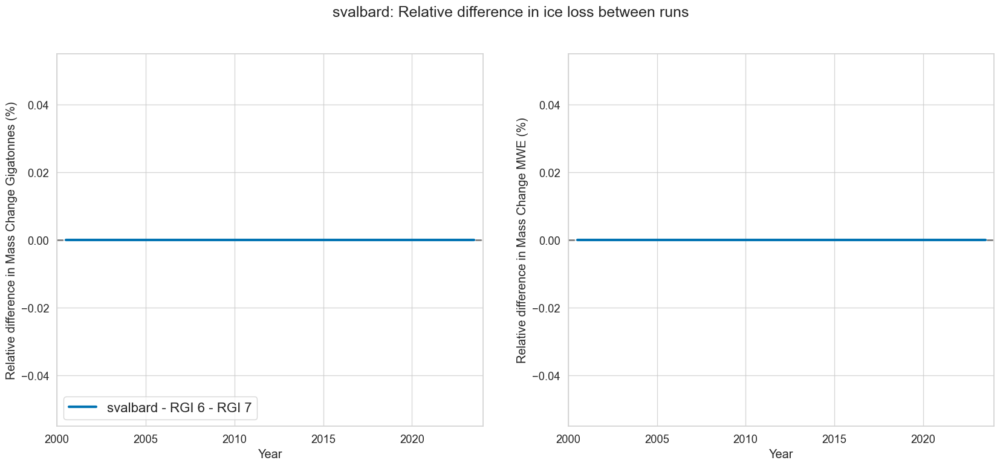

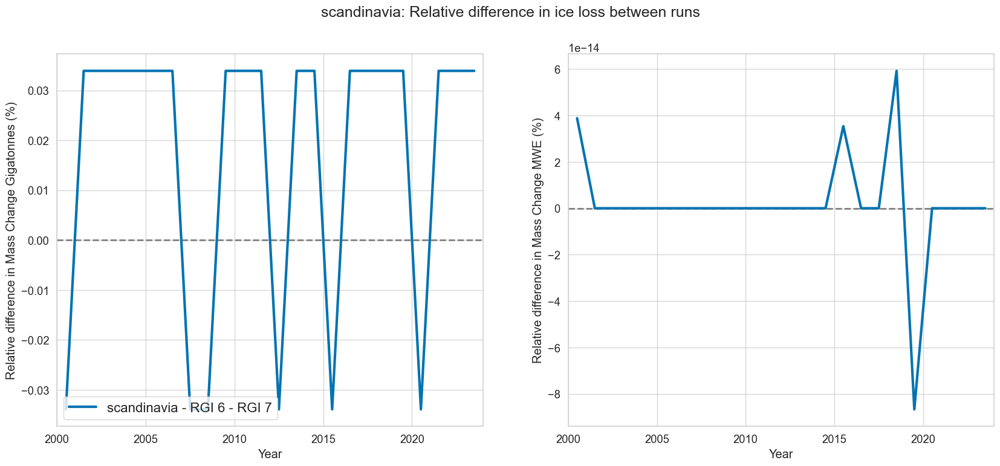

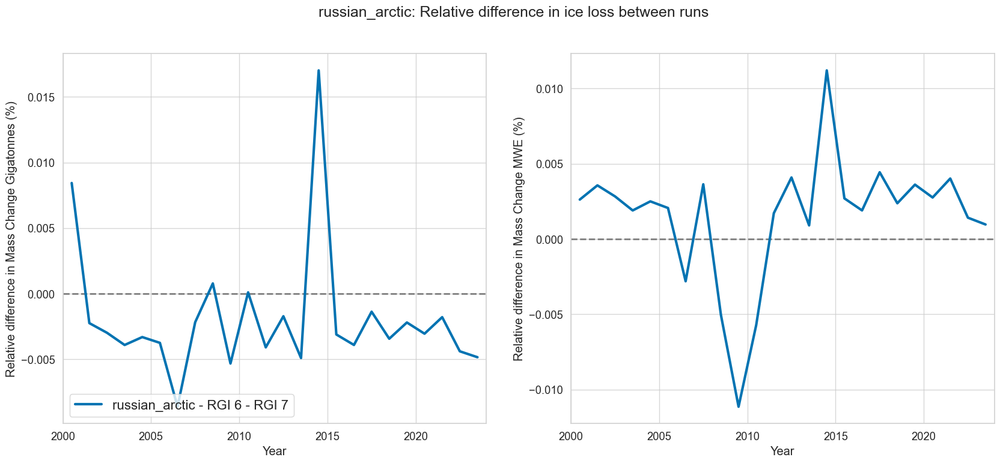

In [146]:
for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #load in the data
    region_rgi6 = pd.read_csv(os.path.join(d_dir_rgi6, region)).drop('Unnamed: 0', axis=1)
    region_rgi7 = pd.read_csv(os.path.join(d_dir_rgi7, region)).drop('Unnamed: 0', axis=1)


    #compute metrics & store values 2012
    rel_diff_df = compute_relative_diff_timeseries(region_rgi6, region_rgi7)

    #plot
    two_runs_relative_difference_plot(region_name, 'RGI 6 - RGI 7', rel_diff_df)


# global + region

In [95]:
#load all region data
glambie_dataframe_dict_cumulative_rgi6, glambie_dataframe_dict_derivative_rgi6 = load_all_region_dataframes(d_dir_rgi6)
glambie_dataframe_dict_cumulative_rgi7, glambie_dataframe_dict_derivative_rgi7 = load_all_region_dataframes(d_dir_rgi7)



In [96]:
#define empty dict
difference_dataframe_dict = {}

#calculate the differences for each region
for key in glambie_dataframe_dict_cumulative_rgi6.keys():
    #load data
    rgi6_df = glambie_dataframe_dict_cumulative_rgi6[key]
    rgi7_df = glambie_dataframe_dict_cumulative_rgi7[key]

    #define dictionairy
    df_dict = {
        'dates': rgi6_df.dates,
        'changes': rgi7_df.changes - rgi6_df.changes,
        'errors': rgi7_df.errors - rgi6_df.errors
    }

    #turn into dataframe
    combined_df = pd.DataFrame(df_dict)

    #add to dict
    difference_dataframe_dict[key] = combined_df


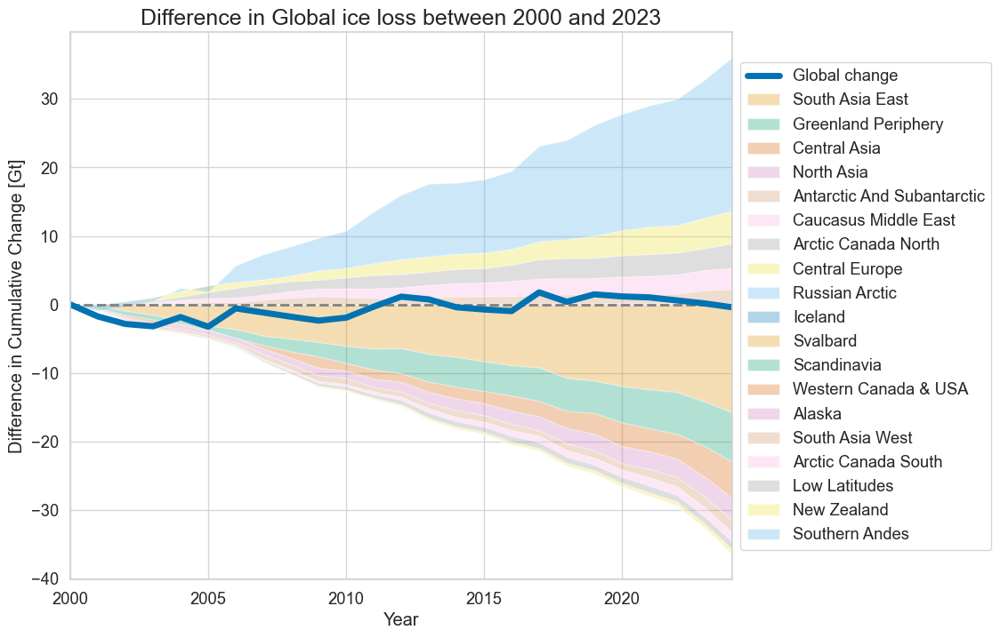

In [97]:
#make plot and save
global_stacked_all_regions_plot2(cum_global_diff, difference_dataframe_dict)
#plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/RGI6 vs 7 plots/global_stacked_regions.png')


In [140]:
#glambie_dataframe_dict_cumulative_rgi7.keys()
glambie_dataframe_dict_cumulative_rgi6['11_central_europe']
#glambie_dataframe_dict_cumulative_rgi7['11_central_europe']
#difference_dataframe_dict['11_central_europe']

,dates,changes,errors
0,2000.0,0.000000,0.000000
1,2001.0,-0.593400,0.600912
2,2002.0,-0.191434,0.741383
3,2003.0,-0.946866,0.848735
4,2004.0,-5.044454,0.968543
5,2005.0,-6.483347,1.049894
6,2006.0,-8.300463,1.122359
7,2007.0,-10.659306,1.195375
8,2008.0,-12.238360,1.260482
9,2009.0,-13.747720,1.329318


In [99]:
y2 = {key:val.changes.tolist() for key, val in difference_dataframe_dict.items()}
sorted_dict = dict(sorted(y2.items(), key=lambda e: e[1][-1]))
    
stack_data = list(sorted_dict.values())
#stack_data[0:12]
#stack_data[10:]

In [100]:
y2 = {key:val.changes.tolist() for key, val in difference_dataframe_dict.items()}
sorted_dict = dict(sorted(y2.items(), key=lambda e: -e[1][-1]))
    
stack_data = list(sorted_dict.values())
labels = list(sorted_dict.keys())

sorted_dict2 = dict(sorted(y2.items(), key=lambda e: e[1][-1]))
stack_data2 = list(sorted_dict2.values())
labels2 = list(sorted_dict2.keys())
labels_tot = labels[0:10] + labels2[0:9]
labels_tot

['17_southern_andes',
 '18_new_zealand',
 '16_low_latitudes',
 '4_arctic_canada_south',
 '14_south_asia_west',
 '1_alaska',
 '2_western_canada_us',
 '8_scandinavia',
 '6_iceland',
 '7_svalbard',
 '15_south_asia_east',
 '5_greenland_periphery',
 '13_central_asia',
 '10_north_asia',
 '19_antarctic_and_subantarctic',
 '12_caucasus_middle_east',
 '3_arctic_canada_north',
 '11_central_europe',
 '9_russian_arctic']

# global + region %

In [141]:
#define empty dict
diff_dataframe_dict = {}

#calculate the differences for each region
for key in glambie_dataframe_dict_cumulative_rgi6.keys():
    #load data
    rgi6_df = glambie_dataframe_dict_derivative_rgi6[key]
    rgi7_df = glambie_dataframe_dict_derivative_rgi7[key]

    #define dictionairy
    df_dict = {
        'dates': rgi6_df.dates,
        'changes': rgi7_df.changes - rgi6_df.changes,
        'errors': rgi7_df.errors - rgi6_df.errors
    }

    #turn into dataframe
    combined_df = pd.DataFrame(df_dict)

    #add to dict
    diff_dataframe_dict[key] = combined_df

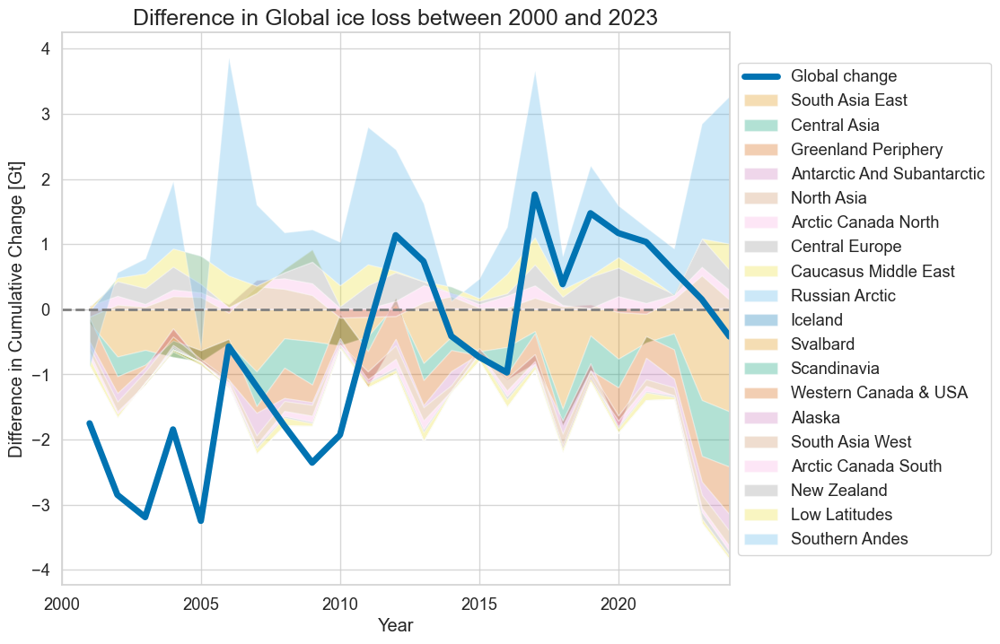

In [143]:
#make plot and save
#def global_stacked_all_regions_plot2(cumulative_data_all_gt, glambie_dataframe_dict):

y2 = {key:val.changes.tolist() for key, val in glambie_dataframe_dict.items()}
sorted_dict = dict(sorted(y2.items(), key=lambda e: e[1][-1]))
    
stack_data = list(sorted_dict.values())
labels = list(sorted_dict.keys())
    
labels_formatted = [transform_string(a) for a in labels]

#plot
_, axs = plt.subplots(1, 1, figsize=(12,8))
axs.set_xlim(2000,2024)
axs.hlines(0, 2000, 2024, linewidth=2, colors=['grey'], linestyle='dashed')
    
plt.plot(cumulative_data_all_gt.dates, cumulative_data_all_gt.changes, linewidth=5, zorder=2, label='Global change')
plt.stackplot( cumulative_data_all_gt.dates, stack_data[0:11], labels=labels_formatted[0:11], alpha=0.3)
plt.stackplot( cumulative_data_all_gt.dates, stack_data[11:], labels=labels_formatted[11:], alpha=0.3)

plt.xlabel('Year')
plt.ylabel('Difference in Cumulative Change [Gt]')

box = axs.get_position()
axs.set_position([box.x0, box.y0, box.width * 0.8, box.height])
axs.legend(loc='center left', bbox_to_anchor=(1, 0.5))
axs.grid(True, alpha=0.8)

plt.title('Difference in Global ice loss between 2000 and 2023', fontsize=18)

#plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/RGI6 vs 7 plots/global_stacked_regions.png')

# relative & absolute change and correlation barplot

In [103]:
list_of_folders = sorted(os.listdir(d_dir_rgi6))
list_of_folders

#for 2012
region_labels = []

rel_gt = []
abs_gt = []
corr_gt = []

rel_mwe = []
abs_mwe = []
corr_mwe = []

for i in range(0,len(list_of_folders)):
    #define region name and path to results
    region = list_of_folders[i]
    
    #get the region name without  the number
    region_name = region[region.find("_")+1:-4]

    #read in the data
    region_rgi6 = pd.read_csv(os.path.join(d_dir_rgi6, region)).drop('Unnamed: 0', axis=1)
    region_rgi7 = pd.read_csv(os.path.join(d_dir_rgi7, region)).drop('Unnamed: 0', axis=1)

    #store region label
    region_labels.append(region_name)

    #compute metrics & store values gt 2012
    rel_diff_val_gt, abs_diff_val_gt, corr_val_gt = compute_all_metrics_gt(region_rgi6, region_rgi7)
    
    rel_gt.append(rel_diff_val_gt)
    abs_gt.append(abs_diff_val_gt)
    corr_gt.append(corr_val_gt)

    #compute metrics & store values mwe 2012
    rel_diff_val_mwe, abs_diff_val_mwe, corr_val_mwe = compute_all_metrics_mwe(region_rgi6, region_rgi7)
    
    rel_mwe.append(rel_diff_val_mwe)
    abs_mwe.append(abs_diff_val_mwe)
    corr_mwe.append(corr_val_mwe)

   

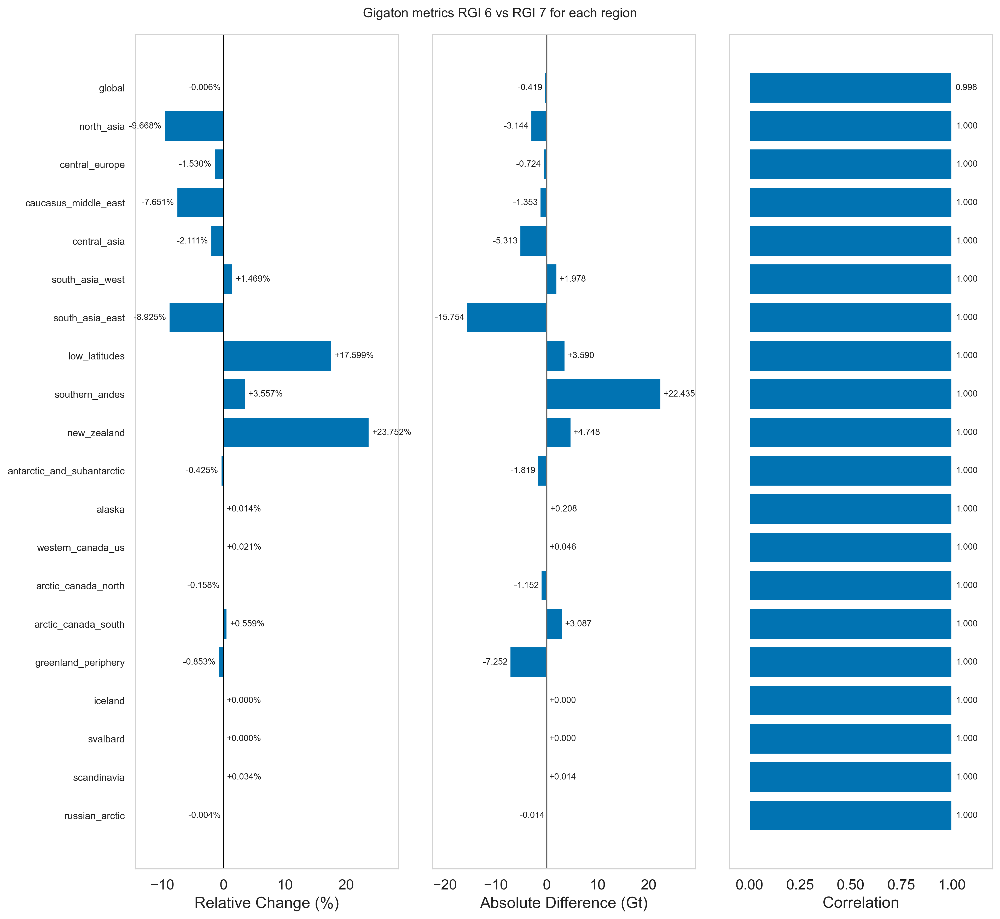

In [108]:
#plot for gt 2012
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(13, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

# Panel 1: Global relative difference (%)
ax1.barh(y_pos, rel_gt)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=9)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)
max_abs_rel = max(abs(v) for v in rel_gt) or 1
for i, val in enumerate(rel_gt):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel, i, f"+{val:.3f}%", va="center", fontsize=8)
    else:
        ax1.text(val - 0.02 * max_abs_rel, i, f"{val:.3f}%", va="center", ha="right", fontsize=8)
pad = max_abs_rel * 0.20
ax1.set_xlim(min(rel_gt) - pad, max(rel_gt) + pad)

# Panel 2: Global absolute difference (Gt)
ax2.barh(y_pos, abs_gt)
ax2.set_xlabel("Absolute Difference (Gt)")
ax2.axvline(0, color="black", linewidth=0.8)
max_abs_diff = max(abs(v) for v in abs_gt) or 1
for i, val in enumerate(abs_gt):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff, i, f"+{val:.3f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff, i, f"{val:.3f}", va="center", ha="right", fontsize=8)
pad = max_abs_diff * 0.30
ax2.set_xlim(min(abs_gt) - pad, max(abs_gt) + pad)

# Panel 3: Global correlation
ax3.barh(y_pos, corr_gt)
ax3.set_xlabel("Correlation")
ax3.set_xlim(-0.1, 1.2)
for i, val in enumerate(corr_gt):
    if val >= 0:
        ax3.text(val + 0.02, i, f"{val:.3f}", va="center", fontsize=8)
    else:
        ax3.text(val + 0.08, i, f"{val:.3f}", va="center", ha="right", fontsize=8)

fig.suptitle(f"Gigaton metrics RGI 6 vs RGI 7 for each region", fontsize=12)
fig.tight_layout()
fig.set_dpi(300)
plt.show()

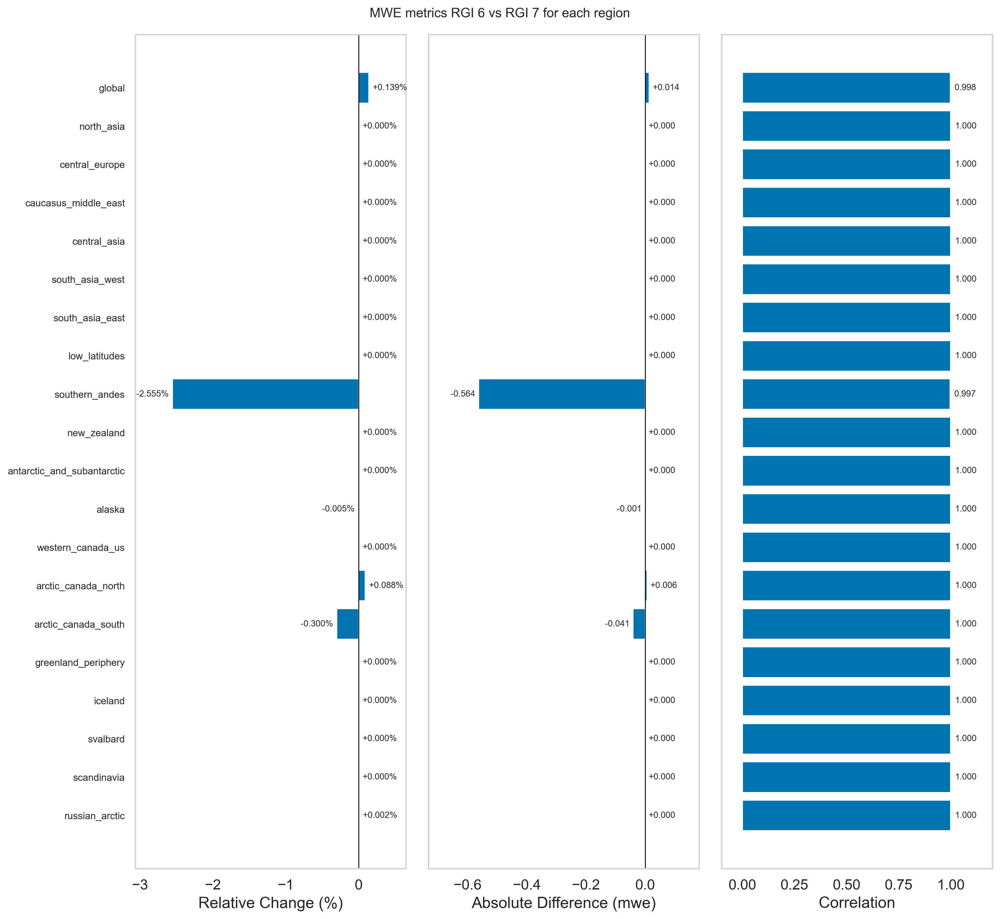

In [109]:
#plot for mwe 2012
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(13, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

# Panel 1: Global relative difference (%)
ax1.barh(y_pos, rel_mwe)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=9)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)
max_abs_rel = max(abs(v) for v in rel_mwe) or 1
for i, val in enumerate(rel_mwe):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel, i, f"+{val:.3f}%", va="center", fontsize=8)
    else:
        ax1.text(val - 0.02 * max_abs_rel, i, f"{val:.3f}%", va="center", ha="right", fontsize=8)
pad = max_abs_rel * 0.20
ax1.set_xlim(min(rel_mwe) - pad, max(rel_mwe) + pad)

# Panel 2: Global absolute difference (mwe)
ax2.barh(y_pos, abs_mwe)
ax2.set_xlabel("Absolute Difference (mwe)")
ax2.axvline(0, color="black", linewidth=0.8)
max_abs_diff = max(abs(v) for v in abs_mwe) or 1
for i, val in enumerate(abs_mwe):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff, i, f"+{val:.3f}", va="center", fontsize=8)
    else:
        ax2.text(val - 0.02 * max_abs_diff, i, f"{val:.3f}", va="center", ha="right", fontsize=8)
pad = max_abs_diff * 0.30
ax2.set_xlim(min(abs_mwe) - pad, max(abs_mwe) + pad)

# Panel 3: Global correlation
ax3.barh(y_pos, corr_mwe)
ax3.set_xlabel("Correlation")
ax3.set_xlim(-0.1, 1.2)
for i, val in enumerate(corr_mwe):
    if val >= 0:
        ax3.text(val + 0.02, i, f"{val:.3f}", va="center", fontsize=8)
    else:
        ax3.text(val + 0.08, i, f"{val:.3f}", va="center", ha="right", fontsize=8)

fig.suptitle(f"MWE metrics RGI 6 vs RGI 7 for each region", fontsize=12)
fig.tight_layout()
fig.set_dpi(300)
plt.show()

# without correlation

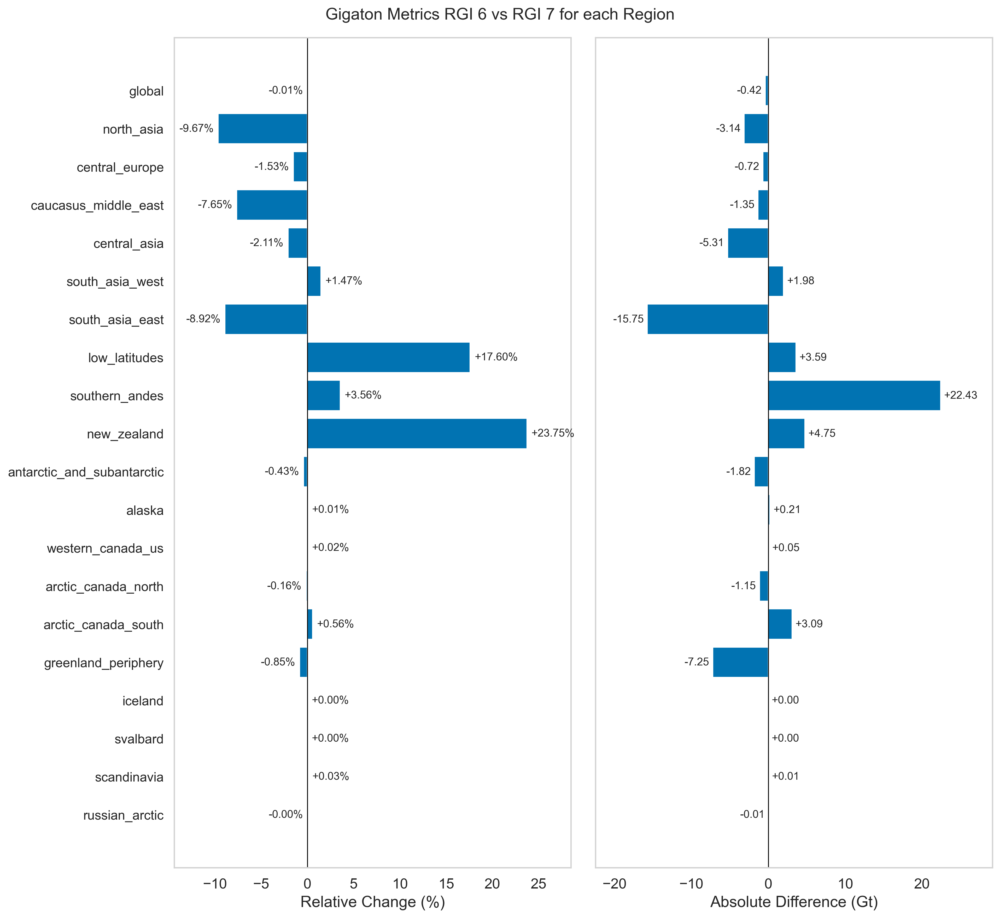

In [160]:
#plot for gt 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

# Panel 1: Global relative difference (%)
ax1.barh(y_pos, rel_gt)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=12)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)
max_abs_rel = max(abs(v) for v in rel_gt) or 1
for i, val in enumerate(rel_gt):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel, i, f"+{val:.2f}%", va="center", fontsize=10)
    else:
        ax1.text(val - 0.02 * max_abs_rel, i, f"{val:.2f}%", va="center", ha="right", fontsize=10)
pad = max_abs_rel * 0.20
ax1.set_xlim(min(rel_gt) - pad, max(rel_gt) + pad)

# Panel 2: Global absolute difference (Gt)
ax2.barh(y_pos, abs_gt)
ax2.set_xlabel("Absolute Difference (Gt)")
ax2.axvline(0, color="black", linewidth=0.8)
max_abs_diff = max(abs(v) for v in abs_gt) or 1
for i, val in enumerate(abs_gt):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff, i, f"+{val:.2f}", va="center", fontsize=10)
    else:
        ax2.text(val - 0.02 * max_abs_diff, i, f"{val:.2f}", va="center", ha="right", fontsize=10)
pad = max_abs_diff * 0.30
ax2.set_xlim(min(abs_gt) - pad, max(abs_gt) + pad)


fig.suptitle(f"Gigaton Metrics RGI 6 vs RGI 7 for each Region", fontsize=15)
fig.tight_layout()
fig.set_dpi(300)
#plt.show()

plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/RGI6 vs 7 plots/gigaton_metrics_barplot_nocorr.png')

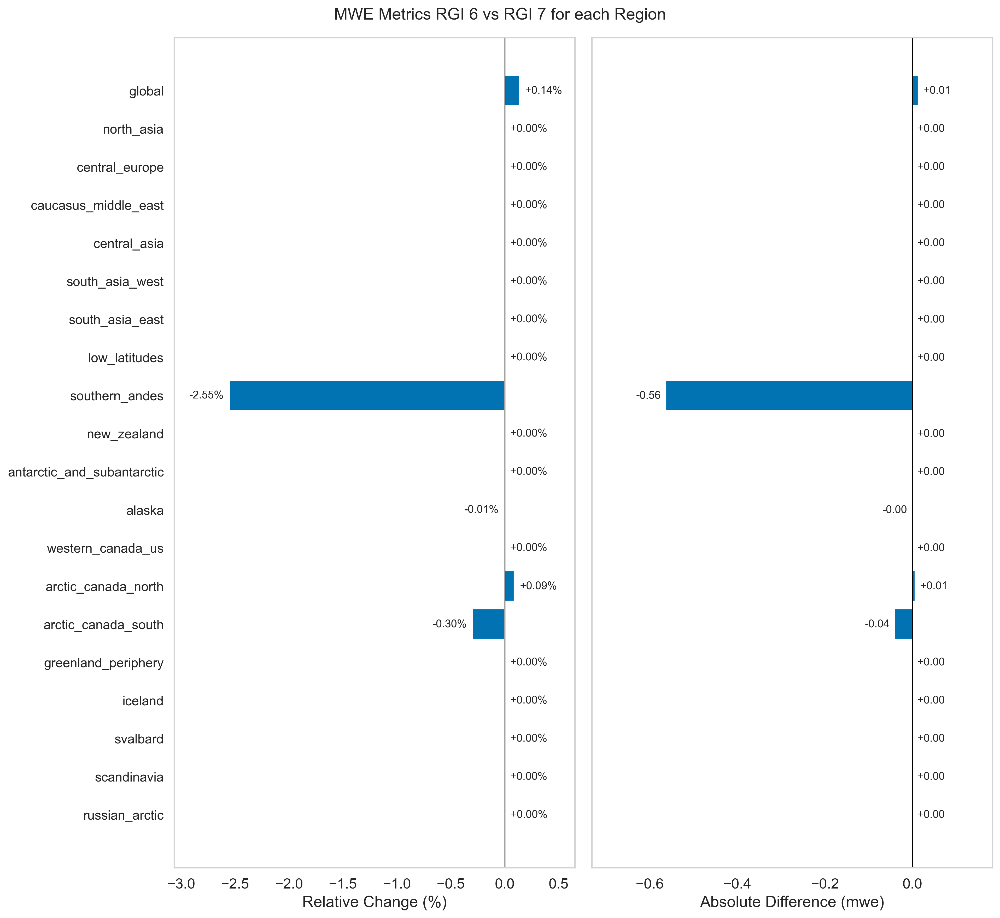

In [162]:
#plot for mwe 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, max(6, len(region_labels) * 0.6)), sharey=True)

n = len(region_labels)
y_pos = np.arange(n)

# Panel 1: Global relative difference (%)
ax1.barh(y_pos, rel_mwe)
ax1.set_yticks(y_pos)
ax1.set_yticklabels(region_labels, fontsize=12)
ax1.invert_yaxis()
ax1.set_xlabel("Relative Change (%)")
ax1.axvline(0, color="black", linewidth=0.8)
max_abs_rel = max(abs(v) for v in rel_mwe) or 1
for i, val in enumerate(rel_mwe):
    if val >= 0:
        ax1.text(val + 0.02 * max_abs_rel, i, f"+{val:.2f}%", va="center", fontsize=10)
    else:
        ax1.text(val - 0.02 * max_abs_rel, i, f"{val:.2f}%", va="center", ha="right", fontsize=10)
pad = max_abs_rel * 0.20
ax1.set_xlim(min(rel_mwe) - pad, max(rel_mwe) + pad)

# Panel 2: Global absolute difference (mwe)
ax2.barh(y_pos, abs_mwe)
ax2.set_xlabel("Absolute Difference (mwe)")
ax2.axvline(0, color="black", linewidth=0.8)
max_abs_diff = max(abs(v) for v in abs_mwe) or 1
for i, val in enumerate(abs_mwe):
    if val >= 0:
        ax2.text(val + 0.02 * max_abs_diff, i, f"+{val:.2f}", va="center", fontsize=10)
    else:
        ax2.text(val - 0.02 * max_abs_diff, i, f"{val:.2f}", va="center", ha="right", fontsize=10)
pad = max_abs_diff * 0.30
ax2.set_xlim(min(abs_mwe) - pad, max(abs_mwe) + pad)


fig.suptitle(f"MWE Metrics RGI 6 vs RGI 7 for each Region", fontsize=15)
fig.tight_layout()
fig.set_dpi(300)
#plt.show()

plt.savefig('C:/Users/Milva/Documents/Uni Freiburg/Semester 2.1/capstone/RGI6 vs 7 plots/mwe_metrics_barplot_nocorr.png')